Process the Adan Neighborhood data

## Data preprocessing

Load a month of monthly Neighborhood Patterns, then prepare data for IPF.

In [114]:
%load_ext autoreload
%autoreload 2
import os
import random
import sqlite3 
import numpy as np
import json
import math
from glob import glob
from tqdm.notebook import tqdm
from tqdm import tqdm
tqdm.pandas()

import calendar


import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

import Advan_operator as ad_op  

pd.set_option('display.max_columns', None)


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Create logger

In [115]:
import logging

# Create a logger object
logger = logging.getLogger('my_logger')
logger.setLevel(logging.DEBUG)  # Set the logging level

# Create a file handler to log messages to a file
file_handler = logging.FileHandler('log_output.log', mode='a')
file_handler.setLevel(logging.DEBUG)

# Create a stream handler to display logging output in Jupyter Lab
stream_handler = logging.StreamHandler()
stream_handler.setLevel(logging.DEBUG)

# Define a formatter and set it for both handlers
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
file_handler.setFormatter(formatter)
stream_handler.setFormatter(formatter)

# Add the handlers to the logger
logger.addHandler(file_handler)
logger.addHandler(stream_handler)

#  logging messages
logger.info("Started...")



2025-12-15 11:13:58,659 - my_logger - INFO - Started...
2025-12-15 11:13:58,659 - my_logger - INFO - Started...


### Load monthly Neighborhood Patterns

#### Asign file locations

In [ ]:
import os
save_dir = os.path.join("..", "hourly_results")
os.makedirs(save_dir, exist_ok=True)

save_file = True
# save_file = False

data_dir = r'D:\OneDrive_Emory\OneDrive - Emory\Research_doc\hourly_population\data'    
monthly_parquet_dir = r'D:\Data\Advan\dewey-downloads\neighborhood-patterns_parquets'

ACS_file = os.path.join(data_dir, "cbg_acs_2019_county_tract_new20230929_cleaned.csv")
# home_panel_fname = os.path.join(data_dir, "home_panel_summary_2019_2023_restated_20240119.csv.gz")  ## large change!!!

# downloaded from Dewey on 2025-10-08
home_panel_fname = r'D:\OneDrive_Emory\OneDrive - Emory\Research_doc\hourly_population\data\neighborhood-patterns-us-home-panel-summary_2022.csv'

# see issues: https://community.deweydata.io/t/residing-device-count-in-2023-07-and-2023-08-surged-abnomorally/26675/15

CBG_2019_fname = os.path.join(data_dir, "blockgroups2019.zip") 

ACS_df =  pd.read_csv(ACS_file, dtype={"CENSUS_BLOCK_GROUP": str})[['fips', 'totalpopulation',  'tract_fips', 'county_fips', 'state_fips']]
ACS_df['fips'] = ACS_df['fips'].astype(str).str.zfill(12)
ACS_df['tract_fips'] = ACS_df['tract_fips'].astype(str).str.zfill(11)
ACS_df['county_fips'] = ACS_df['county_fips'].astype(str).str.zfill(5)
ACS_df['state_fips'] = ACS_df['state_fips'].astype(str).str.zfill(2)
ACS_df = ACS_df.query('state_fips != "72"')
# print("ACS total population:", ACS_df['totalpopulation'].sum())
logger.info(f"ACS total population: {ACS_df['totalpopulation'].sum()}")
ACS_df

ACS total population: 324697795


,fips,totalpopulation,tract_fips,county_fips,state_fips
0,010010201001,730,01001020100,01001,01
1,010010201002,1263,01001020100,01001,01
2,010010202001,835,01001020200,01001,01
3,010010202002,1124,01001020200,01001,01
4,010010203001,2774,01001020300,01001,01
...,...,...,...,...,...
217734,560459511001,1450,56045951100,56045,56
217735,560459511002,1844,56045951100,56045,56
217736,560459513001,1314,56045951300,56045,56
217737,560459513002,1164,56045951300,56045,56


In [ ]:
# CBG_2019_gdf = gpd.read_file(CBG_2019_fname).rename(columns={"GEOID": "fips"})
# CBG_2019_gdf

year = 2022
month = 2

hour_columns = pd.date_range(start=f"{year}-{month}-01", end=f"{year}-{month}-{calendar.monthrange(year, month)[1]} 23:59:59", freq="H") 

logger.info(f"hour_columns: {hour_columns}")

hour_columns

DatetimeIndex(['2022-02-01 00:00:00', '2022-02-01 01:00:00',
               '2022-02-01 02:00:00', '2022-02-01 03:00:00',
               '2022-02-01 04:00:00', '2022-02-01 05:00:00',
               '2022-02-01 06:00:00', '2022-02-01 07:00:00',
               '2022-02-01 08:00:00', '2022-02-01 09:00:00',
               ...
               '2022-02-28 14:00:00', '2022-02-28 15:00:00',
               '2022-02-28 16:00:00', '2022-02-28 17:00:00',
               '2022-02-28 18:00:00', '2022-02-28 19:00:00',
               '2022-02-28 20:00:00', '2022-02-28 21:00:00',
               '2022-02-28 22:00:00', '2022-02-28 23:00:00'],
              dtype='datetime64[ns]', length=672, freq='h')

In [ ]:
# load the monthly visit scaling factor of each county
refined_county_school_month_2022_fname = r"D:\OneDrive_Emory\OneDrive - Emory\Research_doc\hourly_population\hourly_results\refined_county_school_month_2022.csv"
county_visit_scaling_factor_month_df = pd.read_csv(refined_county_school_month_2022_fname, dtype={'county_fips': str, 'state_fips': str}).query("state_fips != '72'")
county_visit_scaling_factor_month_df['month'] = county_visit_scaling_factor_month_df['month'].astype(str).str.zfill(2)
county_visit_scaling_factor_month_df = county_visit_scaling_factor_month_df.query(f"month == '{month:02}'")
# county_visit_scaling_factor_month_df['county_fips'] = county_visit_scaling_factor_month_df['county_fips'].astype(str).str.zfill(2)
logger.info(f"county_visit_scaling_factor_month_df: {county_visit_scaling_factor_month_df.head()}")
county_visit_scaling_factor_month_df 

,county_fips,month,year,noon_visit_80quantile,raw_visitor_counts,schoolday_count,visit_scaling_factor,school_count,state_name,county_name,school_names,state_fips,state_raw_visitor_counts,state_noon_visit_80quantile,state_visit_scaling_factor
1,01001,02,2022,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234
13,01003,02,2022,17858.0,43554.0,125.0,2.439,8.0,Alabama,Baldwin,"Baldwin Co High Sch, Daphne High Sch, Elberta ...",01,731033.0,266875.0,2.739234
25,01005,02,2022,498.0,1231.0,6.0,2.472,2.0,Alabama,Barbour,"Barbour Co High Sch, Eufaula High Sch",01,731033.0,266875.0,2.739234
37,01007,02,2022,713.0,2399.0,19.0,3.365,1.0,Alabama,Bibb,West Blocton High Sch,01,731033.0,266875.0,2.739234
49,01009,02,2022,4024.0,11397.0,58.0,2.832,8.0,Alabama,Blount,"Appalachian Sch, Cleveland High Sch, Hayden Hi...",01,731033.0,266875.0,2.739234
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37645,56037,02,2022,556.0,1565.0,10.0,2.815,2.0,Wyoming,Sweetwater,"Green River High School, Rock Springs High School",56,23065.0,8636.0,2.670797
37657,56039,02,2022,435.0,1112.0,13.0,2.556,1.0,Wyoming,Teton,Jackson Hole High School,56,23065.0,8636.0,2.670797
37669,56041,02,2022,663.0,1746.0,14.0,2.633,1.0,Wyoming,Uinta,Evanston High School,56,23065.0,8636.0,2.670797
37681,56043,02,2022,NaN,NaN,NaN,2.671,NaN,NaN,NaN,NaN,56,23065.0,8636.0,2.670797


In [119]:
non_dict_columns = ['AREA', 
                    "STOPS_BY_DAY", 
                    "RAW_STOP_COUNTS", 
                    "RAW_DEVICE_COUNTS", 
                    "MEDIAN_DWELL", 
                    "STOPS_BY_EACH_HOUR",
                #    'adjusted_raw_stop',
                   ]

month_dir = os.path.join(data_dir, str(year), f'{month:02}', '01')
no_dict_colum_fename = os.path.join(save_dir, f"NP_dict_column_{year}_{month:02}.csv")
device_home_areas_fname = os.path.join(save_dir, f"NP_split_device_home_areas_{year}_{month:02}.csv")
split_home_areas_parquet_dir = r'D:\Data\Advan\dewey-downloads\neighborhood-patterns_split_parquets'

adjusted_dwelling_time_stop_CBG_fname     = os.path.join(save_dir, f"adjusted_dwelling_time_stop_CBG_{year}_{month:02}.csv")
adjusted_dwelling_time_stop_national_fname = os.path.join(save_dir, f"adjusted_dwelling_time_stop_national_{year}_{month:02}.csv")
person_per_device_fname = os.path.join(save_dir, f"person_per_device_{year}_{month:02}.csv")
restored_CBG_hourly_vistor_count_fname = os.path.join(save_dir, f"restored_hourly_vistor_count_CBG_{year}_{month:02}.csv")
restored_target_hourly_vistor_count_fname = os.path.join(save_dir, f"restored_hourly_vistor_count_target_{year}_{month:02}.csv")
CBG_device_stop_destination_distribution_fname  = os.path.join(save_dir, f"CBG_device_stop_destination_distribution_{year}_{month:02}.csv")
CBG_device_stop_origin_distribution_fname = os.path.join(save_dir, f"CBG_device_stop_origin_distribution_{year}_{month:02}.csv")
IPF_results_fname = os.path.join(save_dir, f"IPF_origin_outgoer_hourly_{year}{month:02}.csv")
CBG_hourly_population_fname = os.path.join(save_dir, f"CBG_population_hourly_{year}{month:02}.csv")

CBG_origin_outbound_distribution_sampling_rate_fname = os.path.join(save_dir, f"CBG_origin_outbound_distribution_sampling_rate_{year}{month:02}.csv")
CBG_destination_inbound_per_device_fname = os.path.join(save_dir, f"CBG_destination_inbound_per_device_{year}{month:02}.csv")

CBG_destination_inbound_fname = os.path.join(save_dir, f"CBG_destination_inbound_{year}{month:02}.csv")
inbound_hourly_df_fname = os.path.join(save_dir, f"inbound_hourly_{year}{month:02}.csv")
CBG_agregated_inbound_fname =  os.path.join(save_dir, f"CBG_agregated_inbound_{year}{month:02}.csv")
hourly_agregated_inbound_fname =  os.path.join(save_dir, f"hourly_agregated_inbound_{year}{month:02}.csv")
no_dict_colum_fname = os.path.join(save_dir, f"NP_dict_column_{year}_{month:02}.csv")
 
# month_dir = r'K:\SafeGraph\Advan_2023_API\Neighborhood_Patterns\2023\06\01'
# CBG_list_fname = r"D:\OneDrive_PSU\OneDrive - The Pennsylvania State University\Research_doc\Wild_fire\ACS_2019_CBG_list.csv"

# sqlite_fname = r'F:\Research\Wild_fire\Neighborhood_202306.db'

 
print("Month directory:", month_dir)
print("Save_dir directory:", save_dir)
print("ACS_file:", ACS_file)
print("home_panel file name:", home_panel_fname)

print("No dict colum file name:", no_dict_colum_fname)
print("Device home areas file name:", device_home_areas_fname)
print("Device person_per_device file name:", person_per_device_fname)


print("Device adjusted_dwelling_time_stop_CBG_fname:", adjusted_dwelling_time_stop_CBG_fname)
print("Device adjusted_dwelling_time_stop_national_fname:", adjusted_dwelling_time_stop_national_fname)

print("Restored_hourly_vistor_count_CBG file name:   ", restored_CBG_hourly_vistor_count_fname)
print("Restored_hourly_vistor_count_target file name:", restored_target_hourly_vistor_count_fname)

print("CBG_device_stop_destination_distribution file name:   ", CBG_device_stop_destination_distribution_fname)
print("CBG_device_stop_origin_distribution file name:", CBG_device_stop_origin_distribution_fname)

print("IPF_results file name:", IPF_results_fname)
print("CBG hourly population file name:", CBG_hourly_population_fname)

print("CBG_origin_outbound_distribution_sampling_rate file name:", CBG_origin_outbound_distribution_sampling_rate_fname)


Month directory: D:\OneDrive_Emory\OneDrive - Emory\Research_doc\hourly_population\data\2022\02\01
Save_dir directory: ..\hourly_results
ACS_file: D:\OneDrive_Emory\OneDrive - Emory\Research_doc\hourly_population\data\cbg_acs_2019_county_tract_new20230929_cleaned.csv
home_panel file name: D:\OneDrive_Emory\OneDrive - Emory\Research_doc\hourly_population\data\neighborhood-patterns-us-home-panel-summary_2022.csv
No dict colum file name: ..\hourly_results\NP_dict_column_2022_02.csv
Device home areas file name: ..\hourly_results\NP_split_device_home_areas_2022_02.csv
Device person_per_device file name: ..\hourly_results\person_per_device_2022_02.csv
Device adjusted_dwelling_time_stop_CBG_fname: ..\hourly_results\adjusted_dwelling_time_stop_CBG_2022_02.csv
Device adjusted_dwelling_time_stop_national_fname: ..\hourly_results\adjusted_dwelling_time_stop_national_2022_02.csv
Restored_hourly_vistor_count_CBG file name:    ..\hourly_results\restored_hourly_vistor_count_CBG_2022_02.csv
Restored_h

## Load monthly neighborhood patterns

In [120]:
import duckdb


use_cols =  ["Y", "M", "AREA", 
             "DEVICE_HOME_AREAS",
            # "STOPS_BY_DAY", 
            "RAW_STOP_COUNTS", 
            "RAW_DEVICE_COUNTS", 
            "MEDIAN_DWELL", 
            "STOPS_BY_EACH_HOUR"]
# month_df = ad_op.load_neighborhood_monthly_folder(folder=month_dir, extions=['gz'], start_str="N", use_cols=use_cols, verbose=True)
 

month_df = ad_op.load_neighborhood_monthly_folder_by_duckdb(monthly_parquet_dir=monthly_parquet_dir, year=year, month=month, use_cols=use_cols)
month_df['county_fips'] = month_df['AREA'].str[:5]
month_df = month_df.merge(county_visit_scaling_factor_month_df.query(f"month == '{month:02}'  and year == {year}"), on=[ 'county_fips'], how='left')
# clean str like this:
# "{\"010010205002\":122...}"
# needs about 20 seconds to process
month_df

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

processing field:  DEVICE_HOME_AREAS


,Y,M,AREA,DEVICE_HOME_AREAS,RAW_STOP_COUNTS,RAW_DEVICE_COUNTS,MEDIAN_DWELL,STOPS_BY_EACH_HOUR,county_fips,month,year,noon_visit_80quantile,raw_visitor_counts,schoolday_count,visit_scaling_factor,school_count,state_name,county_name,school_names,state_fips,state_raw_visitor_counts,state_noon_visit_80quantile,state_visit_scaling_factor
0,2022,2,010010201001,"{'010010208021': 110, '010010205002': 100, '01...",8279,2050,14.950000,"[0,0,1,0,3,4,10,29,23,17,8,20,21,28,22,31,22,2...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234
1,2022,2,010010201002,"{'010010201002': 119, '010010205002': 43, '010...",6618,742,252.733333,"[1,2,1,1,0,0,5,13,8,3,3,6,6,12,16,40,19,28,26,...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234
2,2022,2,010010202001,"{'010010208022': 98, '010010205002': 91, '0100...",10354,1449,20.450000,"[2,1,0,0,1,2,16,127,21,17,15,16,13,25,36,72,42...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234
3,2022,2,010010202002,"{'010010205002': 337, '010010208022': 236, '01...",34496,6330,6.850000,"[3,2,2,0,8,8,32,140,89,53,65,76,63,75,115,136,...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234
4,2022,2,010010203001,"{'010010203001': 246, '010010208022': 140, '01...",18975,2565,111.416667,"[1,4,1,1,1,4,13,61,18,20,17,32,16,19,32,101,59...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217667,2022,2,560459513001,"{'560459513003': 55, '560459511002': 44, '5604...",4766,290,31.600000,"[1,2,1,2,1,5,6,12,8,8,10,13,10,14,10,11,16,13,...",56045,02,2022.0,33.0,94.0,1.0,2.848,1.0,Wyoming,Weston,Newcastle High School,56,23065.0,8636.0,2.670797
217668,2022,2,560459513002,"{'560459513003': 67, '560459513002': 63, '5604...",15854,865,17.133333,"[2,0,0,4,2,5,8,43,44,34,40,69,41,27,30,69,54,4...",56045,02,2022.0,33.0,94.0,1.0,2.848,1.0,Wyoming,Weston,Newcastle High School,56,23065.0,8636.0,2.670797
217669,2022,2,560459513003,"{'560459513003': 72, '560459511002': 50, '5604...",5710,344,67.166667,"[0,1,2,0,3,4,2,15,18,6,5,11,13,17,15,22,15,24,...",56045,02,2022.0,33.0,94.0,1.0,2.848,1.0,Wyoming,Weston,Newcastle High School,56,23065.0,8636.0,2.670797
217670,2022,2,780209900000,{},1,1,5.200000,"[0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0...",78020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [121]:
info_str = f"Before visit scaling, RAW_DEVICE_COUNTS (billion): {month_df['RAW_DEVICE_COUNTS'].sum() / 10**9}"
logger.info(info_str)

2025-12-15 11:14:19,042 - my_logger - INFO - Before visit scaling, RAW_DEVICE_COUNTS (billion): 0.482098543
2025-12-15 11:14:19,042 - my_logger - INFO - Before visit scaling, RAW_DEVICE_COUNTS (billion): 0.482098543


In [122]:
len(month_df)

217672

In [123]:
info_str = f"Before visit scaling, RAW_STOP_COUNTS (billion): {month_df['RAW_STOP_COUNTS'].sum() / 10**9}"
logger.info(info_str)  # 2025.12.14: sometimes betwen 11 bi for 2022-10! NOT SURE WHY!! ANSWER: mistakenly mutiplied by the scaling factor !

2025-12-15 11:14:20,346 - my_logger - INFO - Before visit scaling, RAW_STOP_COUNTS (billion): 2.411481222
2025-12-15 11:14:20,346 - my_logger - INFO - Before visit scaling, RAW_STOP_COUNTS (billion): 2.411481222


## Check the total of the hourly stops

Usually are 98.9% of the sum of STOPS_BY_EACH_HOUR column

Become 100% in 2025.7

In [124]:
print("year, month:", year, month)

year, month: 2022 2


In [125]:
def _get_total_hourly_stop(row):
    # print(row)
    hourly_stop = json.loads(row['STOPS_BY_EACH_HOUR'])  # .replace('\"', '')
    total_stop = sum(hourly_stop)
    return total_stop

# need about 10 seconds
 
month_df['total_hourly_stop'] = month_df.iloc[:].apply(_get_total_hourly_stop, axis=1)
ratio = month_df['total_hourly_stop'].sum() / month_df['RAW_STOP_COUNTS'].sum()

print()

info_str = f"Ratio: total_hourly_stop / RAW_STOP_COUNTS =  {ratio}"
logger.info(info_str)
month_df
# the total_hourly_stop is smaller than the RAW_STOP_COUNTS (98.9%), 2025.12, found most are 1.0, had one time 0.35 and 0.12, may be after running the other cells and run this cell again.

2025-12-15 11:14:33,274 - my_logger - INFO - Ratio: total_hourly_stop / RAW_STOP_COUNTS =  1.0
2025-12-15 11:14:33,274 - my_logger - INFO - Ratio: total_hourly_stop / RAW_STOP_COUNTS =  1.0


,Y,M,AREA,DEVICE_HOME_AREAS,RAW_STOP_COUNTS,RAW_DEVICE_COUNTS,MEDIAN_DWELL,STOPS_BY_EACH_HOUR,county_fips,month,year,noon_visit_80quantile,raw_visitor_counts,schoolday_count,visit_scaling_factor,school_count,state_name,county_name,school_names,state_fips,state_raw_visitor_counts,state_noon_visit_80quantile,state_visit_scaling_factor,total_hourly_stop
0,2022,2,010010201001,"{'010010208021': 110, '010010205002': 100, '01...",8279,2050,14.950000,"[0,0,1,0,3,4,10,29,23,17,8,20,21,28,22,31,22,2...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234,8279
1,2022,2,010010201002,"{'010010201002': 119, '010010205002': 43, '010...",6618,742,252.733333,"[1,2,1,1,0,0,5,13,8,3,3,6,6,12,16,40,19,28,26,...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234,6618
2,2022,2,010010202001,"{'010010208022': 98, '010010205002': 91, '0100...",10354,1449,20.450000,"[2,1,0,0,1,2,16,127,21,17,15,16,13,25,36,72,42...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234,10354
3,2022,2,010010202002,"{'010010205002': 337, '010010208022': 236, '01...",34496,6330,6.850000,"[3,2,2,0,8,8,32,140,89,53,65,76,63,75,115,136,...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234,34496
4,2022,2,010010203001,"{'010010203001': 246, '010010208022': 140, '01...",18975,2565,111.416667,"[1,4,1,1,1,4,13,61,18,20,17,32,16,19,32,101,59...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234,18975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217667,2022,2,560459513001,"{'560459513003': 55, '560459511002': 44, '5604...",4766,290,31.600000,"[1,2,1,2,1,5,6,12,8,8,10,13,10,14,10,11,16,13,...",56045,02,2022.0,33.0,94.0,1.0,2.848,1.0,Wyoming,Weston,Newcastle High School,56,23065.0,8636.0,2.670797,4766
217668,2022,2,560459513002,"{'560459513003': 67, '560459513002': 63, '5604...",15854,865,17.133333,"[2,0,0,4,2,5,8,43,44,34,40,69,41,27,30,69,54,4...",56045,02,2022.0,33.0,94.0,1.0,2.848,1.0,Wyoming,Weston,Newcastle High School,56,23065.0,8636.0,2.670797,15854
217669,2022,2,560459513003,"{'560459513003': 72, '560459511002': 50, '5604...",5710,344,67.166667,"[0,1,2,0,3,4,2,15,18,6,5,11,13,17,15,22,15,24,...",56045,02,2022.0,33.0,94.0,1.0,2.848,1.0,Wyoming,Weston,Newcastle High School,56,23065.0,8636.0,2.670797,5710
217670,2022,2,780209900000,{},1,1,5.200000,"[0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0...",78020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


# Adjust the RAW_STOP_COUNTS by dwellling_time

If a stop dwelling > 60 minutes, we add a stop to the next hours. 

In [126]:
# non_adjusted_dwell_time_stop_CBG_arr = ad_op.adjust_stop_by_dwelling_time(np_df=month_df.iloc[:], adjust_dwell_time=False, clean_negative=True)
info_str = f"sum of non_adjusted_dwell_time_stop_CBG_arr (billion): { month_df['RAW_STOP_COUNTS'].sum()/1000000000}"
logger.info(info_str)
# info_str = f"shape of non_adjusted_dwell_time_stop_CBG_arr: {non_adjusted_dwell_time_stop_CBG_arr.shape}"
# logger.info(info_str)

adjusted_dwell_time_stop_CBG_arr = ad_op.adjust_stop_by_dwelling_time(np_df=month_df.iloc[:], adjust_dwell_time=True, clean_negative=True)

adjusted_dwell_time_stop_national_arr = adjusted_dwell_time_stop_CBG_arr.sum(axis=0)

month_df['adjusted_raw_stop'] = adjusted_dwell_time_stop_CBG_arr.sum(axis=1)
month_df[['adjusted_raw_stop', 'RAW_STOP_COUNTS']].sum() / 1000000000

info_str = f"sum of adjusted_dwell_time_stop_CBG_arr (billion): {adjusted_dwell_time_stop_CBG_arr.sum().sum()/1000000000}"
logger.info(info_str)
info_str = f"sum of adjusted_dwell_time_stop_national_arr (billion): {adjusted_dwell_time_stop_national_arr.sum().sum()/1000000000}"
logger.info(info_str)
info_str = f"shape of adjusted_dwell_time_stop_CBG_arr: {adjusted_dwell_time_stop_CBG_arr.shape}"
logger.info(info_str)

# need about 1 minutes
month_df

2025-12-15 11:14:33,398 - my_logger - INFO - sum of non_adjusted_dwell_time_stop_CBG_arr (billion): 2.411481222
2025-12-15 11:14:33,398 - my_logger - INFO - sum of non_adjusted_dwell_time_stop_CBG_arr (billion): 2.411481222


Stop factor:  1


2025-12-15 11:14:55,678 - my_logger - INFO - sum of adjusted_dwell_time_stop_CBG_arr (billion): 3.111878501
2025-12-15 11:14:55,678 - my_logger - INFO - sum of adjusted_dwell_time_stop_CBG_arr (billion): 3.111878501
2025-12-15 11:14:55,681 - my_logger - INFO - sum of adjusted_dwell_time_stop_national_arr (billion): 3.111878501
2025-12-15 11:14:55,681 - my_logger - INFO - sum of adjusted_dwell_time_stop_national_arr (billion): 3.111878501
2025-12-15 11:14:55,685 - my_logger - INFO - shape of adjusted_dwell_time_stop_CBG_arr: (217672, 672)
2025-12-15 11:14:55,685 - my_logger - INFO - shape of adjusted_dwell_time_stop_CBG_arr: (217672, 672)


,Y,M,AREA,DEVICE_HOME_AREAS,RAW_STOP_COUNTS,RAW_DEVICE_COUNTS,MEDIAN_DWELL,STOPS_BY_EACH_HOUR,county_fips,month,year,noon_visit_80quantile,raw_visitor_counts,schoolday_count,visit_scaling_factor,school_count,state_name,county_name,school_names,state_fips,state_raw_visitor_counts,state_noon_visit_80quantile,state_visit_scaling_factor,total_hourly_stop,adjusted_raw_stop
0,2022,2,010010201001,"{'010010208021': 110, '010010205002': 100, '01...",8279,2050,14.950000,"[0,0,1,0,3,4,10,29,23,17,8,20,21,28,22,31,22,2...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234,8279,8279
1,2022,2,010010201002,"{'010010201002': 119, '010010205002': 43, '010...",6618,742,252.733333,"[1,2,1,1,0,0,5,13,8,3,3,6,6,12,16,40,19,28,26,...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234,6618,33090
2,2022,2,010010202001,"{'010010208022': 98, '010010205002': 91, '0100...",10354,1449,20.450000,"[2,1,0,0,1,2,16,127,21,17,15,16,13,25,36,72,42...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234,10354,10354
3,2022,2,010010202002,"{'010010205002': 337, '010010208022': 236, '01...",34496,6330,6.850000,"[3,2,2,0,8,8,32,140,89,53,65,76,63,75,115,136,...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234,34496,34496
4,2022,2,010010203001,"{'010010203001': 246, '010010208022': 140, '01...",18975,2565,111.416667,"[1,4,1,1,1,4,13,61,18,20,17,32,16,19,32,101,59...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234,18975,37950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217667,2022,2,560459513001,"{'560459513003': 55, '560459511002': 44, '5604...",4766,290,31.600000,"[1,2,1,2,1,5,6,12,8,8,10,13,10,14,10,11,16,13,...",56045,02,2022.0,33.0,94.0,1.0,2.848,1.0,Wyoming,Weston,Newcastle High School,56,23065.0,8636.0,2.670797,4766,4766
217668,2022,2,560459513002,"{'560459513003': 67, '560459513002': 63, '5604...",15854,865,17.133333,"[2,0,0,4,2,5,8,43,44,34,40,69,41,27,30,69,54,4...",56045,02,2022.0,33.0,94.0,1.0,2.848,1.0,Wyoming,Weston,Newcastle High School,56,23065.0,8636.0,2.670797,15854,15854
217669,2022,2,560459513003,"{'560459513003': 72, '560459511002': 50, '5604...",5710,344,67.166667,"[0,1,2,0,3,4,2,15,18,6,5,11,13,17,15,22,15,24,...",56045,02,2022.0,33.0,94.0,1.0,2.848,1.0,Wyoming,Weston,Newcastle High School,56,23065.0,8636.0,2.670797,5710,11420
217670,2022,2,780209900000,{},1,1,5.200000,"[0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0...",78020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1


###　Save adjusted  RAW_STOP_COUNTS 

Findings:
1. 2025.07 version neighorhood patterns data have the same result as 2024 version for peroid 2022.1, 2022.3, 2022.5, 2022.6, 07, 08, 09, 10, 11, but not 2022.2, 2022.4, 2022.12

Redid all months

In [127]:
# generate hourly time stamp for this month
hourly_time_stamp = pd.date_range(start=f"{year}-{month:02}-01", end=f"{year}-{month:02}-{calendar.monthrange(year, month)[1]} 23:59:59", freq='H')
hourly_time_stamp

DatetimeIndex(['2022-02-01 00:00:00', '2022-02-01 01:00:00',
               '2022-02-01 02:00:00', '2022-02-01 03:00:00',
               '2022-02-01 04:00:00', '2022-02-01 05:00:00',
               '2022-02-01 06:00:00', '2022-02-01 07:00:00',
               '2022-02-01 08:00:00', '2022-02-01 09:00:00',
               ...
               '2022-02-28 14:00:00', '2022-02-28 15:00:00',
               '2022-02-28 16:00:00', '2022-02-28 17:00:00',
               '2022-02-28 18:00:00', '2022-02-28 19:00:00',
               '2022-02-28 20:00:00', '2022-02-28 21:00:00',
               '2022-02-28 22:00:00', '2022-02-28 23:00:00'],
              dtype='datetime64[ns]', length=672, freq='h')

In [128]:
# convert numpy array to Pandas DataFrame
# CBG level
# hourly_columns = [f'hour_{h+1}' for h in range(adjusted_dwell_time_stop_CBG_arr.shape[1])]
hourly_columns = pd.date_range(start=f"{year}-{month:02}-01", end=f"{year}-{month:02}-{calendar.monthrange(year, month)[1]} 23:59:59", freq='H')
assert len(hourly_columns) == adjusted_dwell_time_stop_CBG_arr.shape[1], "hourly_columns and adjusted_dwell_time_stop_CBG_arr.shape[1] do not match"
adjusted_dwelling_time_stop_CBG_df = pd.DataFrame(adjusted_dwell_time_stop_CBG_arr, columns=hourly_columns)
adjusted_dwelling_time_stop_CBG_df['CBG'] = month_df['AREA'].astype(str).str.zfill(12).to_list()
# adjusted_dwelling_time_stop_CBG_df = adjusted_dwelling_time_stop_CBG_df[['CBG'] + hourly_columns]  # reorder columns
# adjusted_dwelling_time_stop_CBG_df = adjusted_dwelling_time_stop_CBG_df.sort_values('CBG')
adjusted_dwelling_time_stop_CBG_df.set_index('CBG', inplace=True)
# national level
adjusted_dwelling_time_stop_national_df = pd.DataFrame(adjusted_dwell_time_stop_national_arr, columns=['stop'])

adjusted_dwelling_time_stop_CBG_df

,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

In [129]:
adjusted_dwelling_time_stop_national_df['stop'].sum() / 10**9

np.float64(3.111878501)

In [130]:
# Save CSV files
if save_file:
    adjusted_dwelling_time_stop_national_df.to_csv(adjusted_dwelling_time_stop_national_fname, index=False)
    print("Saved national hourly stop at:", adjusted_dwelling_time_stop_national_fname)

    adjusted_dwelling_time_stop_CBG_df.to_csv(adjusted_dwelling_time_stop_CBG_fname, index=False)
    print("Saved CBG hourly stop at:", adjusted_dwelling_time_stop_CBG_fname)

# needs about 20 seconds

Saved national hourly stop at: ..\hourly_results\adjusted_dwelling_time_stop_national_2022_02.csv
Saved CBG hourly stop at: ..\hourly_results\adjusted_dwelling_time_stop_CBG_2022_02.csv


In [131]:
adjusted_dwelling_time_stop_national_df
adjusted_dwelling_time_stop_CBG_df

,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

In [132]:
adjusted_dwelling_time_stop_national_df['stop'].sum() /  10**9, adjusted_dwelling_time_stop_CBG_df.iloc[:, 1:].sum().sum() /  10**9
# should be the same

(np.float64(3.111878501), np.float64(3.110915355))

RAW_STOP_COUNTS is large than the sum(stop) in "DEVICE_HOME_AREAS", result_df['stop'].sum() / result_df['RAW_STOP_COUNTS'].sum() = 85%
Above not found in Dec. 2025.

The DEVICE_HOME_AREAS column report less CBGs # thant the RAW_STOP_COUNTS column.
home_areas['device'].sum() / month_df['RAW_STOP_COUNTS'].sum() = 92% for Dec. 2022

### verify the relationship between raw_device_count and the sum of home areas.

In [133]:
# ============parquet data name format ===========
# split_home_areas_parquet_dir = r'D:\Data\Advan\dewey-downloads\neighborhood-patterns_split_parquets'
# 2022_01_DEVICE_HOME_AREAS.parquet
# 2022_01_WEEKDAY_DEVICE_HOME_AREAS.parquet
# 2022_01_WEEKEND_DEVICE_HOME_AREAS.parquet
# columns: 'origin', 'destination', 'device'

## test some months
# month = 10 
# print("Loading month:", month)
# month_df = ad_op.load_neighborhood_monthly_folder_by_duckdb(monthly_parquet_dir=monthly_parquet_dir, year=year, month=month, use_cols=['RAW_DEVICE_COUNTS'])

# con = duckdb.connect()
# ##  create a view for parquet files in the folder
# filed = 'DEVICE_HOME_AREAS'
# con.execute(f"""
#     CREATE OR REPLACE VIEW device_home_areas AS
#     SELECT device FROM read_parquet('{split_home_areas_parquet_dir}/{year}_{month:02}_{filed}.parquet')
# """)

# print("Querying data...")
# device_home_areas_df = con.execute(f"""
#     SELECT device
#     FROM device_home_areas
# """).df()

# #### need about 2 miniutes
# print(f"Device home areas device to month_df RAW_DEVICE_COUNTS ratio: {year}-{month:02} =" )
# device_home_areas_df['device'].sum() / month_df['RAW_DEVICE_COUNTS'].sum()

# 2024.12 test results:
# 2022.12: 0.92
# 2022.11: 0.92
# 2022.10: 0.93
# 2022.09: 0.93
# 2022.08: 0.92
# 2022.07: 0.92
# 2022.06: 0.93
# 2022.05: 0.92
# 2022.04: 0.92
# 2022.03: 0.92
# 2022.02: 0.92
# 2022.01: 0.91

In [134]:
# make a test
df = month_df.sample(300)
df['county_fips'] = df['AREA'].str[:5]
county_visit_scaling_factor_month_df['month'] = county_visit_scaling_factor_month_df['month'].astype(str).str.zfill(2)
# df = df.merge(county_visit_scaling_factor_month_df.query(f"month == '{month}'  and year == {year}"), on=[ 'county_fips'], how='left')
# df[['AREA', 'total_hourly_stop', 'adjusted_raw_stop', 'visit_scaling_factor','MEDIAN_DWELL']].sort_values('AREA')
df

,Y,M,AREA,DEVICE_HOME_AREAS,RAW_STOP_COUNTS,RAW_DEVICE_COUNTS,MEDIAN_DWELL,STOPS_BY_EACH_HOUR,county_fips,month,year,noon_visit_80quantile,raw_visitor_counts,schoolday_count,visit_scaling_factor,school_count,state_name,county_name,school_names,state_fips,state_raw_visitor_counts,state_noon_visit_80quantile,state_visit_scaling_factor,total_hourly_stop,adjusted_raw_stop
121507,2022,2,340076113003,"{'340076113003': 81, '340076083031': 53, '3400...",6856,1726,85.250000,"[0,0,0,0,0,1,5,8,7,11,8,12,9,9,20,13,24,24,20,...",34007,02,2022.0,17848.0,48097.0,220.0,2.695,18.0,New Jersey,Camden,"Audubon Junior Senior High School, Black Horse...",34,855924.0,338119.0,2.531428,6856,13712
159390,2022,2,400272009003,"{'400272009003': 60, '400272012022': 60, '4002...",6729,2145,19.616667,"[2,0,2,1,0,2,4,10,28,10,9,10,22,16,27,19,35,27...",40027,02,2022.0,5754.0,15432.0,42.0,2.682,6.0,Oklahoma,Cleveland,"Little Axe Es, Noble Hs, Norman Hs, Norman Nor...",40,208943.0,75896.0,2.753017,6729,6729
42554,2022,2,120210104053,"{'120210104152': 155, '120210104053': 80, '120...",8070,2892,15.216667,"[1,1,1,0,0,2,6,10,11,9,13,14,14,19,16,21,29,27...",12021,02,2022.0,10797.0,28767.0,104.0,2.664,10.0,Florida,Collier,"Barron Collier High School, Collier Virtual In...",12,1786387.0,633552.0,2.819638,8070,8070
163061,2022,2,410390018041,"{'410390018041': 63, '410390018042': 56, '4103...",3787,653,102.533333,"[1,0,1,0,0,0,5,0,8,5,5,1,5,9,16,10,12,16,13,5,...",41039,02,2022.0,8090.0,17800.0,130.0,2.200,10.0,Oregon,Lane,"Churchill High School, Cottage Grove High Scho...",41,163263.0,69227.0,2.358372,3787,7574
197231,2022,2,484510013013,"{'484510013013': 70, '484510013012': 37, '4845...",5377,934,81.833333,"[0,0,2,0,0,1,2,11,14,10,8,13,15,9,16,14,27,22,...",48451,02,2022.0,164.0,420.0,5.0,2.561,4.0,Texas,Tom Green,"Christoval H S, Grape Creek H S, Tlc Academy, ...",48,2745449.0,1066218.0,2.574942,5377,10754
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120896,2022,2,340057004082,"{'340057029061': 116, '340076033021': 71, '340...",22072,9565,6.816667,"[2,3,1,0,4,9,9,24,27,25,22,31,58,52,52,55,56,8...",34005,02,2022.0,29893.0,75770.0,322.0,2.535,22.0,New Jersey,Burlington,"Bordentown Regional High School, Bulington Cit...",34,855924.0,338119.0,2.531428,22072,22072
143096,2022,2,361231505004,"{'361231504003': 86, '361231502001': 64, '3612...",9470,1171,7.333333,"[3,2,0,0,0,3,6,17,18,21,17,24,28,14,28,18,21,3...",36123,02,2022.0,NaN,NaN,NaN,2.449,NaN,NaN,NaN,NaN,36,1121043.0,457674.0,2.449436,9470,9470
177004,2022,2,450570101002,"{'450570101002': 146, '450570101001': 130, '45...",12782,1581,102.500000,"[6,1,1,1,0,0,5,13,24,17,10,12,8,12,25,31,41,47...",45057,02,2022.0,955.0,2927.0,16.0,3.065,3.0,South Carolina,Lancaster,"Andrew Jackson High, Buford High, Lancaster High",45,491320.0,180048.0,2.728828,12782,25564
12605,2022,2,060190039005,"{'060190039005': 31, '060190040012': 13, '0601...",2946,391,61.700000,"[0,0,0,0,1,0,5,4,7,3,9,6,10,14,12,14,5,9,1,1,6...",06019,02,2022.0,2794.0,6421.0,18.0,2.298,6.0,California,Fresno,"Clovis North High, Coalinga High, Erma Duncan ...",06,692122.0,250987.0,2.757601,2946,5892


In [135]:
# make a test
df = month_df.sample(300)
print(" device_home_areas_test_df:", df[['RAW_DEVICE_COUNTS','RAW_STOP_COUNTS']].sum())

device_home_areas_test_df = ad_op.split_device_home_areas_stops_naive(np_df=df.iloc[:], field='DEVICE_HOME_AREAS', stop_factor=1, total_stop_column = 'adjusted_raw_stop')    # previous version without scaling factor is: split_device_home_areas_stops_by_scaling_factor()

 
result_df = device_home_areas_test_df.groupby('destination', as_index=False)[['device']].sum().merge(df, left_on='destination', right_on='AREA').drop(columns='AREA')
result_df = result_df[['destination',  'RAW_STOP_COUNTS']]    # [['AREA', 'RAW_STOP_COUNTS', 'RAW_DEVICE_COUNTS']]
result_df.sort_values('destination')#[['total_hourly_stop', 'adjusted_raw_stop', 'visit_scaling_factor','MEDIAN_DWELL']]
print("# device_home_areas_test_df:", device_home_areas_test_df[['device','stop']].sum())
device_home_areas_test_df
# df

 device_home_areas_test_df: RAW_DEVICE_COUNTS     590177
RAW_STOP_COUNTS      3124648
dtype: int64


300it [00:00, 1129.95it/s]

# device_home_areas_test_df: device    5.385780e+05
stop      3.824361e+06
dtype: float64


,origin,device,stop,destination
0,300290013013,49,2304.366534,300290013013
1,300470001001,29,1363.808765,300290013013
2,300290013011,22,1034.613546,300290013013
3,300290013012,14,658.390438,300290013013
4,300470002001,14,658.390438,300290013013
...,...,...,...,...
69308,261299505003,4,20.187562,261379506001
69309,260770030041,4,20.187562,261379506001
69310,260639507001,4,20.187562,261379506001
69311,260339705002,4,20.187562,261379506001


### Save the a single CSV for further use, only keep the non-dictionary columns.

In [136]:
# non_dict_columns = ['AREA', 
#                     "STOPS_BY_DAY", 
#                     "RAW_STOP_COUNTS", 
#                     "RAW_DEVICE_COUNTS", 
#                     "MEDIAN_DWELL", 
#                     "STOPS_BY_EACH_HOUR",
#                    'adjusted_raw_stop',
#                    ]
# # save CSV file
# if save_file:
#     month_df[non_dict_columns].to_csv(no_dict_colum_fname, index=False)
#     print("Combined CSV wihouth dictionary columns was saved at:", no_dict_colum_fname)

## Split the DEVICE_HOME_AREAS column

Some CBGs are not reported because their visitors < 4, we add them according to the RAW_DEVICE_COUNTS

Note: need > 30 GB memory if use Pandas

In [137]:
# Check whether the top origin is itself
month_df.sample(1)[['AREA', 'DEVICE_HOME_AREAS']]

,AREA,DEVICE_HOME_AREAS
157003,391290202003,"{'391290202003': 55, '391290204002': 32, '3912..."


In [138]:
county_visit_scaling_factor_month_df

,county_fips,month,year,noon_visit_80quantile,raw_visitor_counts,schoolday_count,visit_scaling_factor,school_count,state_name,county_name,school_names,state_fips,state_raw_visitor_counts,state_noon_visit_80quantile,state_visit_scaling_factor
1,01001,02,2022,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234
13,01003,02,2022,17858.0,43554.0,125.0,2.439,8.0,Alabama,Baldwin,"Baldwin Co High Sch, Daphne High Sch, Elberta ...",01,731033.0,266875.0,2.739234
25,01005,02,2022,498.0,1231.0,6.0,2.472,2.0,Alabama,Barbour,"Barbour Co High Sch, Eufaula High Sch",01,731033.0,266875.0,2.739234
37,01007,02,2022,713.0,2399.0,19.0,3.365,1.0,Alabama,Bibb,West Blocton High Sch,01,731033.0,266875.0,2.739234
49,01009,02,2022,4024.0,11397.0,58.0,2.832,8.0,Alabama,Blount,"Appalachian Sch, Cleveland High Sch, Hayden Hi...",01,731033.0,266875.0,2.739234
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37645,56037,02,2022,556.0,1565.0,10.0,2.815,2.0,Wyoming,Sweetwater,"Green River High School, Rock Springs High School",56,23065.0,8636.0,2.670797
37657,56039,02,2022,435.0,1112.0,13.0,2.556,1.0,Wyoming,Teton,Jackson Hole High School,56,23065.0,8636.0,2.670797
37669,56041,02,2022,663.0,1746.0,14.0,2.633,1.0,Wyoming,Uinta,Evanston High School,56,23065.0,8636.0,2.670797
37681,56043,02,2022,NaN,NaN,NaN,2.671,NaN,NaN,NaN,NaN,56,23065.0,8636.0,2.670797


In [139]:
# needs 5 minutes

# month_df['RAW_STOP_COUNTS'] = month_df['RAW_STOP_COUNTS'] * month_df['visit_scaling_factor']
# month_df['adjusted_raw_stop'] = month_df['adjusted_raw_stop'] * month_df['visit_scaling_factor']
 
month_df = month_df.sort_values('AREA')
device_home_areas_df = ad_op.split_device_home_areas_stops_naive(np_df=month_df.iloc[:], field='DEVICE_HOME_AREAS', stop_factor=1, total_stop_column ="adjusted_raw_stop")   # previous version without scaling factor  

# device_home_areas_df = ad_op.split_device_home_areas_stops_by_scaling_factor(np_df=month_df.iloc[:], field='DEVICE_HOME_AREAS', stop_factor=1, total_stop_column ="adjusted_raw_stop")


# print("Sorting...")
## device_home_areas_df = device_home_areas_df.sort_values(['origin', 'destination'])
## device_home_areas_df = device_home_areas_df.sort_values(['origin', 'device'])
# device_home_areas_df['origin'] = device_home_areas_dfcounty_visit_scaling_factor_month_df['origin'].astype(str).str.zfill(12)
# device_home_areas_df['destination'] = device_home_areas_df['destination'].astype(str).str.zfill(12)
## device_home_areas_df['device'] = device_home_areas_df['device'].astype(int)

if save_file:
    print(f"Saving at: {device_home_areas_fname}...")
    device_home_areas_df.to_csv(device_home_areas_fname, index=False)
print("Done")

device_home_areas_df

217672it [03:08, 1152.51it/s]


Saving at: ..\hourly_results\NP_split_device_home_areas_2022_02.csv...
Done


,origin,device,stop,destination
0,010010208021,110,444.239024,010010201001
1,010010205002,100,403.853659,010010201001
2,010010208022,96,387.699512,010010201001
3,010010206001,94,379.622439,010010201001
4,010010208012,90,363.468293,010010201001
...,...,...,...,...
55442713,560119502003,4,132.790698,560459513003
55442714,560050003002,4,132.790698,560459513003
55442715,460339652001,4,132.790698,560459513003
55442716,482917003002,4,132.790698,560459513003


In [140]:
 device_home_areas_df[['device', 'stop']].sum() / 10**9

device    0.441868
stop      2.832435
dtype: float64

In [141]:
# month_df_raw = ad_op.load_neighborhood_monthly_folder_by_duckdb(monthly_parquet_dir=monthly_parquet_dir, year=year, month=month, use_cols=use_cols)
# month_df_raw['RAW_STOP_COUNTS'].sum() / 10**9

In [142]:
month_df['RAW_STOP_COUNTS'].sum() / 10**9

np.float64(2.411481222)

In [143]:
month_df['RAW_STOP_COUNTS'].sum() / 10**9,  month_df['RAW_DEVICE_COUNTS'].sum() / 10**9    

(np.float64(2.411481222), np.float64(0.482098543))

In [144]:
print("One device contrubite stop count:")
month_df['RAW_STOP_COUNTS'].sum() /  month_df['RAW_DEVICE_COUNTS'].sum()    

One device contrubite stop count:


np.float64(5.002050425196991)

In [145]:
# load duckdb data 
# month_df = ad_op.load_neighborhood_monthly_folder_by_duckdb(monthly_parquet_dir=monthly_parquet_dir, year=year, month=month, use_cols=use_cols)

# field = 'DEVICE_HOME_AREAS'
# month_df[field] = month_df[field].apply(ad_op.parse_home_area_string)

# needs about 20 seconds
# month_df

may need to re-consider `adjusted_raw_stop`, which is the sum of the adjusted hourly stops according to `median_dwell_time`.

In [146]:
# device_home_areas_df[['device', 'stop']].sum() / 10**9, month_df[['RAW_DEVICE_COUNTS', 'RAW_STOP_COUNTS', 'adjusted_raw_stop']].sum() / 10**9

### Save aggregation for origin and destination distribution

In [147]:
# Save aggregation for origin and destination distribution
# 
CBG_device_stop_destination_distribution_df = device_home_areas_df.groupby('destination')[['device', 'stop']].sum()
CBG_device_stop_origin_distribution_df = device_home_areas_df.groupby('origin')[['device', 'stop']].sum()

if save_file:
    CBG_device_stop_destination_distribution_df.to_csv(CBG_device_stop_destination_distribution_fname)
    CBG_device_stop_origin_distribution_df.to_csv(CBG_device_stop_origin_distribution_fname)

CBG_device_stop_origin_distribution_df

,device,stop
origin,,
010010201001,1244,10094.522732
010010201002,3209,29582.457279
010010202001,1383,10095.153258
010010202002,2288,17541.900425
010010203001,6165,47428.029542
...,...,...
CA:59410351,56,446.324472
CA:59490184,8,26.935449
CA:59530101,28,126.207010


In [148]:
CBG_device_stop_destination_distribution_df#.reset_index()

,device,stop
destination,,
010010201001,1933,7806.491220
010010201002,694,30949.407008
010010202001,1378,9846.661146
010010202002,6122,33362.482148
010010203001,2514,37195.438596
...,...,...
560459511001,236,4638.768116
560459511002,278,10385.285714
560459513001,244,4010.013793


In [149]:
CBG_device_stop_destination_distribution_df[['device', 'stop']].sum()  / 10**9, CBG_device_stop_origin_distribution_df[['device', 'stop']].sum()  / 10**9

(device    0.441868
 stop      2.832435
 dtype: float64,
 device    0.441868
 stop      2.832435
 dtype: float64)

## Generate person_per_device (i.e., device sampling rate) file for origin CBGs

In [150]:
ACS_df = pd.read_csv(ACS_file)
ACS_df["fips"] = ACS_df["fips"].astype(str).str.zfill(12)
ACS_df["CBG_FIPS"] = ACS_df["fips"].astype(str).str.zfill(12)
print("Total US population (million):",  ACS_df['totalpopulation'].sum() / 10**6)
ACS_df

Total US population (million): 328.016242


,fips,totalpopulation,male,female,under5years,5to9years,10to14years,15to17years,18to24years,25to34years,35to44years,45to54years,55to64years,65to74years,75to84years,85yearsandover,whitealone,blackorafricanamericanalone,americanindianandalaskanativealone,asianalone,nativehawaiianandotherpacificislanderalone,someotherracealone,twoormoreraces,Hispanic_or_Latino,population25yearsandover,population25yearsandoverlessthanhighschool,population25yearsandoverhighschoolgraduateincludesequivalency,population25yearsandoversomecollege,population25yearsandoverbachelorsdegree,population25yearsandovermastersdegree,population25yearsandoverprofessionalschooldegree,population25yearsandoverdoctoratedegree,households,householdslessthan10000,households10000to14999,households15000to19999,households20000to24999,households25000to29999,households30000to34999,households35000to39999,households40000to44999,households45000to49999,households50000to59999,households60000to74999,households75000to99999,households100000to124999,households125000to149999,households150000to199999,households200000ormore,state,state_fips,county_fips,tract_fips,CBG_FIPS
0,010010201001,730,293,437,17,32,24,43,104,69,87,126,96,94,23,15,613,60,0,0,0,0,57,7,510,106,187,126,41,19,31,0,315,15,52,62,10,7,7,32,9,8,4,36,19,5,7,26,16,al,1,1001,1001020100,010010201001
1,010010201002,1263,614,649,98,54,123,23,152,131,159,219,172,83,28,21,1072,92,0,2,0,0,97,19,813,60,276,209,164,99,0,5,394,11,3,38,18,5,0,2,7,10,52,42,79,19,39,47,22,al,1,1001,1001020100,010010201002
2,010010202001,835,393,442,52,89,37,78,36,79,133,76,91,90,68,6,276,507,0,0,21,0,31,30,543,68,309,114,46,6,0,0,318,38,72,40,0,21,6,20,15,12,18,27,28,16,5,0,0,al,1,1001,1001020200,010010202001
3,010010202002,1124,665,459,47,55,42,19,101,210,166,227,137,54,18,48,483,610,0,0,0,6,25,0,860,140,337,195,138,28,17,5,370,26,11,25,3,0,46,5,36,18,54,8,62,29,31,16,0,al,1,1001,1001020200,010010202002
4,010010203001,2774,1423,1351,55,258,220,80,151,505,398,336,380,216,133,42,1866,557,0,32,5,233,81,233,2010,254,736,625,204,172,0,19,1026,69,40,49,20,40,13,59,59,19,153,213,75,110,75,24,8,al,1,1001,1001020300,010010203001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220328,721537506011,883,480,403,48,78,120,12,79,45,105,70,120,169,24,13,719,0,0,0,0,164,0,883,546,167,152,126,84,17,0,0,237,102,14,45,19,0,0,31,7,19,0,0,0,0,0,0,0,pr,72,72153,72153750601,721537506011
220329,721537506012,2523,1010,1513,227,175,96,36,308,250,260,436,197,394,106,38,1946,89,51,0,0,408,29,2523,1681,190,675,414,291,77,15,19,740,97,140,96,61,97,58,32,28,47,57,8,0,19,0,0,0,pr,72,72153,72153750601,721537506012
220330,721537506013,991,477,514,86,37,162,76,190,53,90,191,89,17,0,0,538,227,0,0,0,226,0,956,440,0,30,74,290,0,18,28,256,48,9,8,0,42,0,0,39,0,12,56,24,18,0,0,0,pr,72,72153,72153750601,721537506013
220331,721537506021,1577,795,782,68,36,18,24,82,169,225,272,254,232,188,9,1116,23,0,0,0,438,0,1577,1349,590,482,64,177,36,0,0,560,303,78,91,8,0,11,32,0,0,10,27,0,0,0,0,0,pr,72,72153,72153750602,721537506021


In [151]:
print("Loading home panel file:", home_panel_fname)
panel_df = pd.read_csv(home_panel_fname)
panel_df['CENSUS_BLOCK_GROUP'] = panel_df['CENSUS_BLOCK_GROUP'].astype(str).str.zfill(12)
panel_df

Loading home panel file: D:\OneDrive_Emory\OneDrive - Emory\Research_doc\hourly_population\data\neighborhood-patterns-us-home-panel-summary_2022.csv


,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR
0,010010201001,US,1,54,48,al,2022
1,010010201002,US,1,84,126,al,2022
2,010010202001,US,1,103,57,al,2022
3,010010202002,US,1,113,106,al,2022
4,010010203001,US,1,179,254,al,2022
...,...,...,...,...,...,...,...
2624026,780309611001,US,12,277,201,vi,2022
2624027,780309611002,US,12,342,220,vi,2022
2624028,780309612001,US,12,15,17,vi,2022
2624029,780309612002,US,12,43,33,vi,2022


monthly_device_cnt_df   (million):


,YEAR,MONTH,NUMBER_DEVICES_RESIDING
0,2022,1,16.497266
1,2022,2,16.366722
2,2022,3,20.873403
3,2022,4,21.106425
4,2022,5,21.417417
5,2022,6,27.068475
6,2022,7,23.423205
7,2022,8,23.704177
8,2022,9,23.945662
9,2022,10,23.583317


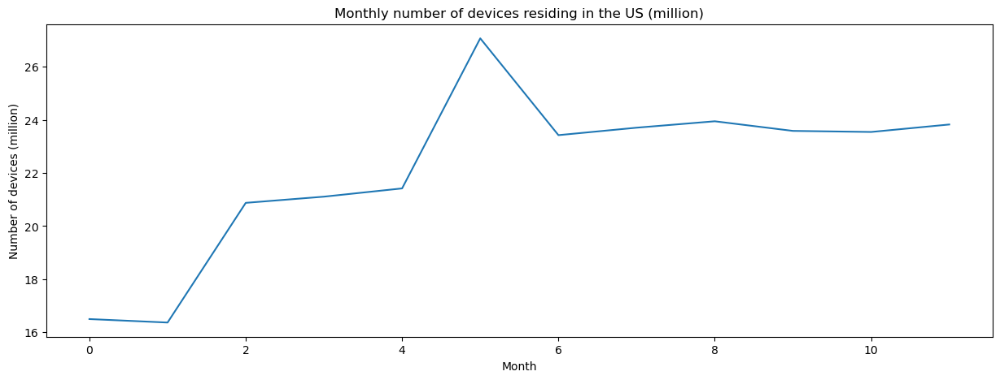

In [152]:
monthly_device_cnt_df = panel_df.query(f"ISO_COUNTRY_CODE == 'US' ").groupby(['YEAR', 'MONTH'], as_index=True)['NUMBER_DEVICES_RESIDING'].sum() / 10**6
print("monthly_device_cnt_df   (million):" )
monthly_device_cnt_df = monthly_device_cnt_df.reset_index() 
fig, ax = plt.subplots(figsize=(15, 5))
monthly_device_cnt_df['NUMBER_DEVICES_RESIDING'].plot()
ax.set_title("Monthly number of devices residing in the US (million)")
ax.set_xlabel("Month")
ax.set_ylabel("Number of devices (million)")
monthly_device_cnt_df

The NUMBER_DEVICES_RESIDING surged from 45 million to 900 million, and the sampling rate cannot be obatain, because it exceeds the US population.  (not found in 2025.12)

In [153]:
target_panel_df = panel_df.query(f"YEAR == {year} and MONTH == {int(month)} and ISO_COUNTRY_CODE == 'US' ").sort_values('CENSUS_BLOCK_GROUP')  # 
# target_panel_df = panel_df.query(f"YEAR == {year} and MON == {6} and ISO_COUNTRY_CODE == 'US' ").sort_values('CENSUS_BLOCK_GROUP')  # 
print(f"In YEAR: {year}, MONTH: {month}, US devices residing (million):" )
print("Total US NUMBER_DEVICES_RESIDING (million):",  target_panel_df['NUMBER_DEVICES_RESIDING'].sum() / 10**6)

target_panel_df

In YEAR: 2022, MONTH: 2, US devices residing (million):
Total US NUMBER_DEVICES_RESIDING (million): 16.366722


,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR
216938,010010201001,US,2,51,47,al,2022
216939,010010201002,US,2,77,121,al,2022
216940,010010202001,US,2,128,65,al,2022
216941,010010202002,US,2,119,96,al,2022
216942,010010203001,US,2,151,249,al,2022
...,...,...,...,...,...,...,...
433864,560459513001,US,2,31,33,wy,2022
433865,560459513002,US,2,105,65,wy,2022
433866,560459513003,US,2,56,75,wy,2022
433867,720499905010,US,2,4,3,pr,2022


In [154]:
panel_ACS_df = target_panel_df.merge(ACS_df[['CBG_FIPS', 'totalpopulation']], left_on='CENSUS_BLOCK_GROUP', right_on='CBG_FIPS')
panel_ACS_df = panel_ACS_df.dropna(subset='NUMBER_DEVICES_RESIDING')
panel_ACS_df['NUMBER_DEVICES_RESIDING'] = panel_ACS_df['NUMBER_DEVICES_RESIDING'].astype(int)
panel_ACS_df = panel_ACS_df.sort_values('CBG_FIPS')
panel_ACS_df['person_per_device'] = panel_ACS_df['totalpopulation'] / panel_ACS_df['NUMBER_DEVICES_RESIDING']
panel_ACS_df['sampling_rate'] = panel_ACS_df['NUMBER_DEVICES_RESIDING'] / panel_ACS_df['totalpopulation']

print("Data cover US population (million) :", panel_ACS_df['totalpopulation'].sum() / 10**6)
panel_ACS_df

Data cover US population (million) : 324.545344


,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR,CBG_FIPS,totalpopulation,person_per_device,sampling_rate
0,010010201001,US,2,51,47,al,2022,010010201001,730,15.531915,0.064384
1,010010201002,US,2,77,121,al,2022,010010201002,1263,10.438017,0.095804
2,010010202001,US,2,128,65,al,2022,010010202001,835,12.846154,0.077844
3,010010202002,US,2,119,96,al,2022,010010202002,1124,11.708333,0.085409
4,010010203001,US,2,151,249,al,2022,010010203001,2774,11.140562,0.089762
...,...,...,...,...,...,...,...,...,...,...,...
216925,560459511002,US,2,45,63,wy,2022,560459511002,1844,29.269841,0.034165
216926,560459513001,US,2,31,33,wy,2022,560459513001,1314,39.818182,0.025114
216927,560459513002,US,2,105,65,wy,2022,560459513002,1164,17.907692,0.055842
216928,560459513003,US,2,56,75,wy,2022,560459513003,1277,17.026667,0.058731


<Axes: title={'center': 'Device sampling rate histogram (2022-02)'}, xlabel='Sampling rate', ylabel='CBG count'>

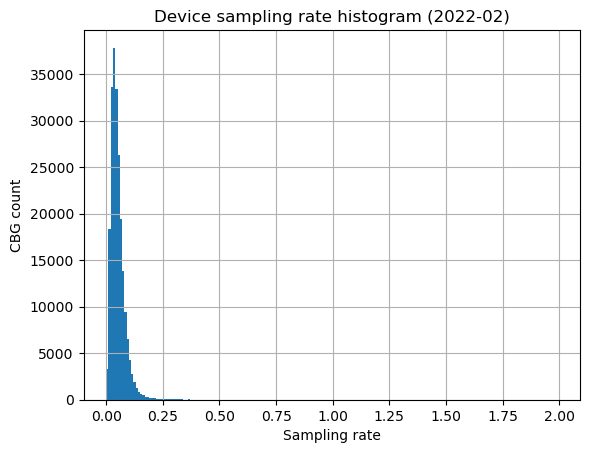

In [155]:
fig, ax = plt.subplots()

ax.set_title(f"Device sampling rate histogram ({year}-{month:02})")
ax.set_xlabel("Sampling rate")
ax.set_ylabel("CBG count")

panel_ACS_df.query("totalpopulation > 0  ")['sampling_rate'].dropna().hist(ax=ax, bins=np.array(range(0, 200,1))/100)

In [156]:
# get people_per_device of a county

panel_ACS_df['county_FIPS'] = panel_ACS_df['CBG_FIPS'].str[:5]
sampling_rate_county_df = panel_ACS_df.groupby(['county_FIPS'], as_index=False).agg(    # , 'YEAR', "MON", "REGION", "ISO_COUNTRY_CODE"
    county_device=('NUMBER_DEVICES_RESIDING', 'sum'),
    county_device_daytime=('NUMBER_DEVICES_RESIDING', 'sum'),
    county_device_population=('totalpopulation', 'sum'),
    ) 

sampling_rate_county_df['person_per_device_county'] = sampling_rate_county_df['county_device_population'] /  sampling_rate_county_df['county_device']

print("National device and population count:\n")
print(sampling_rate_county_df[['county_device', 'county_device_population']].sum())

print("\nNational person per device:\n")
print(sampling_rate_county_df['county_device'].sum() / sampling_rate_county_df['county_device_population'].sum())

people_per_device_df = panel_ACS_df.merge(sampling_rate_county_df, left_on='county_FIPS', right_on='county_FIPS')
people_per_device_df.to_csv(person_per_device_fname, index=False)
people_per_device_df

National device and population count:

county_device                16366719
county_device_population    324545344
dtype: int64

National person per device:

0.05042968356372415


,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR,CBG_FIPS,totalpopulation,person_per_device,sampling_rate,county_FIPS,county_device,county_device_daytime,county_device_population,person_per_device_county
0,010010201001,US,2,51,47,al,2022,010010201001,730,15.531915,0.064384,01001,5363,5363,55380,10.326310
1,010010201002,US,2,77,121,al,2022,010010201002,1263,10.438017,0.095804,01001,5363,5363,55380,10.326310
2,010010202001,US,2,128,65,al,2022,010010202001,835,12.846154,0.077844,01001,5363,5363,55380,10.326310
3,010010202002,US,2,119,96,al,2022,010010202002,1124,11.708333,0.085409,01001,5363,5363,55380,10.326310
4,010010203001,US,2,151,249,al,2022,010010203001,2774,11.140562,0.089762,01001,5363,5363,55380,10.326310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216925,560459511002,US,2,45,63,wy,2022,560459511002,1844,29.269841,0.034165,56045,289,289,7049,24.391003
216926,560459513001,US,2,31,33,wy,2022,560459513001,1314,39.818182,0.025114,56045,289,289,7049,24.391003
216927,560459513002,US,2,105,65,wy,2022,560459513002,1164,17.907692,0.055842,56045,289,289,7049,24.391003
216928,560459513003,US,2,56,75,wy,2022,560459513003,1277,17.026667,0.058731,56045,289,289,7049,24.391003


## Compute the inbounds for each destination CBG

merge the device_home_area and person_per_device, then groupby the destination

In [157]:
# device_home_areas_df = pd.read_csv(device_home_areas_fname, dtype={"origin":str, "destination":str})
device_home_areas_df

,origin,device,stop,destination
0,010010208021,110,444.239024,010010201001
1,010010205002,100,403.853659,010010201001
2,010010208022,96,387.699512,010010201001
3,010010206001,94,379.622439,010010201001
4,010010208012,90,363.468293,010010201001
...,...,...,...,...
55442713,560119502003,4,132.790698,560459513003
55442714,560050003002,4,132.790698,560459513003
55442715,460339652001,4,132.790698,560459513003
55442716,482917003002,4,132.790698,560459513003


In [158]:
# people_per_device_df = pd.to_csv(person_per_device_fname, index=False)
person_per_device_df = people_per_device_df
# print("Loading people_per_device_df from:", person_per_device_fname)
# person_per_device_df = pd.read_csv(person_per_device_fname, dtype={"CBG_FIPS": str, 'CENSUS_BLOCK_GROUP': str})


print("Total totalpopulation (billion):", people_per_device_df['totalpopulation'].sum() / 10**9)
person_per_device_df

Total totalpopulation (billion): 0.324545344


,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR,CBG_FIPS,totalpopulation,person_per_device,sampling_rate,county_FIPS,county_device,county_device_daytime,county_device_population,person_per_device_county
0,010010201001,US,2,51,47,al,2022,010010201001,730,15.531915,0.064384,01001,5363,5363,55380,10.326310
1,010010201002,US,2,77,121,al,2022,010010201002,1263,10.438017,0.095804,01001,5363,5363,55380,10.326310
2,010010202001,US,2,128,65,al,2022,010010202001,835,12.846154,0.077844,01001,5363,5363,55380,10.326310
3,010010202002,US,2,119,96,al,2022,010010202002,1124,11.708333,0.085409,01001,5363,5363,55380,10.326310
4,010010203001,US,2,151,249,al,2022,010010203001,2774,11.140562,0.089762,01001,5363,5363,55380,10.326310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216925,560459511002,US,2,45,63,wy,2022,560459511002,1844,29.269841,0.034165,56045,289,289,7049,24.391003
216926,560459513001,US,2,31,33,wy,2022,560459513001,1314,39.818182,0.025114,56045,289,289,7049,24.391003
216927,560459513002,US,2,105,65,wy,2022,560459513002,1164,17.907692,0.055842,56045,289,289,7049,24.391003
216928,560459513003,US,2,56,75,wy,2022,560459513003,1277,17.026667,0.058731,56045,289,289,7049,24.391003


In [159]:
origin_person_per_device_df = device_home_areas_df.merge(person_per_device_df[['CBG_FIPS', 'person_per_device', 'person_per_device_county']], left_on="origin", right_on="CBG_FIPS")

print("mean person per device:")
print(origin_person_per_device_df[['person_per_device', 'person_per_device_county']].mean())
print("median person per device:")
print(origin_person_per_device_df[['person_per_device', 'person_per_device_county']].median())

origin_person_per_device_df

mean person per device:
person_per_device           22.065106
person_per_device_county    21.392059
dtype: float64
median person per device:
person_per_device           18.758794
person_per_device_county    19.801987
dtype: float64


,origin,device,stop,destination,CBG_FIPS,person_per_device,person_per_device_county
0,010010208021,110,444.239024,010010201001,010010208021,12.240310,10.326310
1,010010205002,100,403.853659,010010201001,010010205002,8.308011,10.326310
2,010010208022,96,387.699512,010010201001,010010208022,9.984252,10.326310
3,010010206001,94,379.622439,010010201001,010010206001,10.000000,10.326310
4,010010208012,90,363.468293,010010201001,010010208012,9.233202,10.326310
...,...,...,...,...,...,...,...
55425264,560119502003,4,132.790698,560459513003,560119502003,22.050000,25.765517
55425265,560050003002,4,132.790698,560459513003,560050003002,15.884211,19.819816
55425266,460339652001,4,132.790698,560459513003,460339652001,18.369231,20.661137
55425267,482917003002,4,132.790698,560459513003,482917003002,7.536585,10.863335


In [160]:
origin_person_per_device_df['person_CBG_rate'] = origin_person_per_device_df['device'] * origin_person_per_device_df['person_per_device'] # total person (inbound) using CBG level person per device rate
origin_person_per_device_df['person_county_rate'] = origin_person_per_device_df['device'] * origin_person_per_device_df['person_per_device_county']  # total person (inbound) using county level person per device rate
print(origin_person_per_device_df[['person_CBG_rate','person_county_rate']].sum() / 10**9)

# origin_person_per_device_df

person_CBG_rate       8.802482
person_county_rate    8.821107
dtype: float64


In [161]:
def get_inbound_person_per_device(df):
    inboud_per_per_device_CBG_rate = df['person_CBG_rate'].sum() /  df['device'].sum()
    inboud_per_per_device_county_rate = df['person_county_rate'].sum() /  df['device'].sum()
    return {"inboud_per_per_device_CBG_rate": inboud_per_per_device_CBG_rate, "inboud_per_per_device_county_rate": inboud_per_per_device_county_rate}

# combine the orgin per person per device to destination
CBG_destination_inbound_per_device = origin_person_per_device_df.iloc[:].groupby('destination').progress_apply(get_inbound_person_per_device)
CBG_destination_inbound_per_device_df = pd.DataFrame(CBG_destination_inbound_per_device.tolist(), index=CBG_destination_inbound_per_device.index)

if save_file:
    print(f"Saving at: {CBG_destination_inbound_per_device_fname}...")
    CBG_destination_inbound_per_device_df.to_csv(CBG_destination_inbound_per_device_fname)
print(CBG_destination_inbound_per_device_df.mean())
print(CBG_destination_inbound_per_device_df[['inboud_per_per_device_CBG_rate','inboud_per_per_device_county_rate']].median()  )

CBG_destination_inbound_per_device_df

100%|██████████| 217425/217425 [00:36<00:00, 6034.63it/s]


Saving at: ..\hourly_results\CBG_destination_inbound_per_device_202202.csv...
inboud_per_per_device_CBG_rate       23.436801
inboud_per_per_device_county_rate    22.711376
dtype: float64
inboud_per_per_device_CBG_rate       21.529898
inboud_per_per_device_county_rate    20.945783
dtype: float64


,inboud_per_per_device_CBG_rate,inboud_per_per_device_county_rate
destination,,
010010201001,10.404338,10.533752
010010201002,10.194721,10.425608
010010202001,10.423655,10.726381
010010202002,10.427655,10.820282
010010203001,10.094237,10.516377
...,...,...
560459511001,23.654032,22.708794
560459511002,22.170792,22.813089
560459513001,23.999509,23.793018


In [162]:
# print("Loading CBG_destination_inbound_per_device_df from:", CBG_destination_inbound_per_device_fname)
# CBG_destination_inbound_per_device_df = pd.read_csv(CBG_destination_inbound_per_device_fname, dtype={"destination": str}).set_index('destination')

print("CBG_destination_inbound_per_device_df.median():\n", CBG_destination_inbound_per_device_df.median() )
CBG_destination_inbound_per_device_df

CBG_destination_inbound_per_device_df.median():
 inboud_per_per_device_CBG_rate       21.529898
inboud_per_per_device_county_rate    20.945783
dtype: float64


,inboud_per_per_device_CBG_rate,inboud_per_per_device_county_rate
destination,,
010010201001,10.404338,10.533752
010010201002,10.194721,10.425608
010010202001,10.423655,10.726381
010010202002,10.427655,10.820282
010010203001,10.094237,10.516377
...,...,...
560459511001,23.654032,22.708794
560459511002,22.170792,22.813089
560459513001,23.999509,23.793018


In [163]:
# if save_file:
#     print("Loading adjusted_dwelling_time_stop_CBG_df from:", adjusted_dwelling_time_stop_CBG_fname)
#     adjusted_dwelling_time_stop_CBG_df = pd.read_csv(adjusted_dwelling_time_stop_CBG_fname, dtype={"CBG": str}).set_index('CBG')

print("Total adjusted hourly stops (billion):", adjusted_dwelling_time_stop_CBG_df.iloc[:, 1:].sum().sum() / 10**9)
# try:
#     adjusted_dwelling_time_stop_CBG_df.set_index('CBG', inplace=True)
# except ValueError as e:
#     print("Error setting index:", e)
# adjusted_dwelling_time_stop_CBG_df
adjusted_dwelling_time_stop_CBG_df

Total adjusted hourly stops (billion): 3.110915355


,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

In [164]:
# try:
#     CBG_destination_inbound_per_device_df.set_index('destination', inplace=True)
# except ValueError as e:
#     # print("Error setting index:", e)
#     pass
CBG_destination_inbound_per_device_df
# adjusted_dwelling_time_stop_CBG_df

,inboud_per_per_device_CBG_rate,inboud_per_per_device_county_rate
destination,,
010010201001,10.404338,10.533752
010010201002,10.194721,10.425608
010010202001,10.423655,10.726381
010010202002,10.427655,10.820282
010010203001,10.094237,10.516377
...,...,...
560459511001,23.654032,22.708794
560459511002,22.170792,22.813089
560459513001,23.999509,23.793018


In [165]:
adjusted_dwelling_time_stop_inbound_per_device_CBG_df = adjusted_dwelling_time_stop_CBG_df.merge(CBG_destination_inbound_per_device_df,left_index=True, right_index=True)
adjusted_dwelling_time_stop_inbound_per_device_CBG_df.index.name = 'CBG'
adjusted_dwelling_time_stop_inbound_per_device_CBG_df

,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

In [166]:
# sclae the stop by visit scaling factor
county_visit_scaling_factor_month_df

,county_fips,month,year,noon_visit_80quantile,raw_visitor_counts,schoolday_count,visit_scaling_factor,school_count,state_name,county_name,school_names,state_fips,state_raw_visitor_counts,state_noon_visit_80quantile,state_visit_scaling_factor
1,01001,02,2022,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234
13,01003,02,2022,17858.0,43554.0,125.0,2.439,8.0,Alabama,Baldwin,"Baldwin Co High Sch, Daphne High Sch, Elberta ...",01,731033.0,266875.0,2.739234
25,01005,02,2022,498.0,1231.0,6.0,2.472,2.0,Alabama,Barbour,"Barbour Co High Sch, Eufaula High Sch",01,731033.0,266875.0,2.739234
37,01007,02,2022,713.0,2399.0,19.0,3.365,1.0,Alabama,Bibb,West Blocton High Sch,01,731033.0,266875.0,2.739234
49,01009,02,2022,4024.0,11397.0,58.0,2.832,8.0,Alabama,Blount,"Appalachian Sch, Cleveland High Sch, Hayden Hi...",01,731033.0,266875.0,2.739234
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37645,56037,02,2022,556.0,1565.0,10.0,2.815,2.0,Wyoming,Sweetwater,"Green River High School, Rock Springs High School",56,23065.0,8636.0,2.670797
37657,56039,02,2022,435.0,1112.0,13.0,2.556,1.0,Wyoming,Teton,Jackson Hole High School,56,23065.0,8636.0,2.670797
37669,56041,02,2022,663.0,1746.0,14.0,2.633,1.0,Wyoming,Uinta,Evanston High School,56,23065.0,8636.0,2.670797
37681,56043,02,2022,NaN,NaN,NaN,2.671,NaN,NaN,NaN,NaN,56,23065.0,8636.0,2.670797


In [167]:
hour_cnt = adjusted_dwelling_time_stop_CBG_df.shape[1]
print("hour_cnt:", hour_cnt)

hour_cnt: 672


In [168]:
# inbound_hourly_df.iloc[:, hour]
# inbound_hourly_df.loc[:, 'inboud_per_per_device_CBG_rate']
month_df

,Y,M,AREA,DEVICE_HOME_AREAS,RAW_STOP_COUNTS,RAW_DEVICE_COUNTS,MEDIAN_DWELL,STOPS_BY_EACH_HOUR,county_fips,month,year,noon_visit_80quantile,raw_visitor_counts,schoolday_count,visit_scaling_factor,school_count,state_name,county_name,school_names,state_fips,state_raw_visitor_counts,state_noon_visit_80quantile,state_visit_scaling_factor,total_hourly_stop,adjusted_raw_stop
0,2022,2,010010201001,"{'010010208021': 110, '010010205002': 100, '01...",8279,2050,14.950000,"[0,0,1,0,3,4,10,29,23,17,8,20,21,28,22,31,22,2...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234,8279,8279
1,2022,2,010010201002,"{'010010201002': 119, '010010205002': 43, '010...",6618,742,252.733333,"[1,2,1,1,0,0,5,13,8,3,3,6,6,12,16,40,19,28,26,...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234,6618,33090
2,2022,2,010010202001,"{'010010208022': 98, '010010205002': 91, '0100...",10354,1449,20.450000,"[2,1,0,0,1,2,16,127,21,17,15,16,13,25,36,72,42...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234,10354,10354
3,2022,2,010010202002,"{'010010205002': 337, '010010208022': 236, '01...",34496,6330,6.850000,"[3,2,2,0,8,8,32,140,89,53,65,76,63,75,115,136,...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234,34496,34496
4,2022,2,010010203001,"{'010010203001': 246, '010010208022': 140, '01...",18975,2565,111.416667,"[1,4,1,1,1,4,13,61,18,20,17,32,16,19,32,101,59...",01001,02,2022.0,3029.0,8717.0,43.0,2.878,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,731033.0,266875.0,2.739234,18975,37950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217667,2022,2,560459513001,"{'560459513003': 55, '560459511002': 44, '5604...",4766,290,31.600000,"[1,2,1,2,1,5,6,12,8,8,10,13,10,14,10,11,16,13,...",56045,02,2022.0,33.0,94.0,1.0,2.848,1.0,Wyoming,Weston,Newcastle High School,56,23065.0,8636.0,2.670797,4766,4766
217668,2022,2,560459513002,"{'560459513003': 67, '560459513002': 63, '5604...",15854,865,17.133333,"[2,0,0,4,2,5,8,43,44,34,40,69,41,27,30,69,54,4...",56045,02,2022.0,33.0,94.0,1.0,2.848,1.0,Wyoming,Weston,Newcastle High School,56,23065.0,8636.0,2.670797,15854,15854
217669,2022,2,560459513003,"{'560459513003': 72, '560459511002': 50, '5604...",5710,344,67.166667,"[0,1,2,0,3,4,2,15,18,6,5,11,13,17,15,22,15,24,...",56045,02,2022.0,33.0,94.0,1.0,2.848,1.0,Wyoming,Weston,Newcastle High School,56,23065.0,8636.0,2.670797,5710,11420
217670,2022,2,780209900000,{},1,1,5.200000,"[0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0...",78020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1


## compute the inbound

In [169]:
# needs about 3 minutes

inbound_hourly_df = adjusted_dwelling_time_stop_inbound_per_device_CBG_df.astype(np.float64).copy()
inbound_hourly_df['county_fips'] = inbound_hourly_df.index.str[:5]
inbound_hourly_df = inbound_hourly_df.reset_index().merge(county_visit_scaling_factor_month_df, on='county_fips', how='left').set_index('CBG')

for hour in tqdm(range(hour_cnt)):
    inbound_hourly_df.iloc[:, hour] = inbound_hourly_df.iloc[:, hour] * inbound_hourly_df.loc[:, 'inboud_per_per_device_CBG_rate'] * inbound_hourly_df.loc[:, 'visit_scaling_factor']   # 70.4215236989238 billion
    # inbound_hourly_df.iloc[:, hour] = inbound_hourly_df.iloc[:, hour] * inbound_hourly_df.loc[:, 'inboud_per_per_device_county_rate']   # 56.34291367286323 billion
print("Total restored inbound (billion) using per_device_CBG_rate:",  inbound_hourly_df.iloc[:, :hour].sum().sum() / 10**9)

inbound_hourly_df = adjusted_dwelling_time_stop_inbound_per_device_CBG_df.astype(np.float64).copy()
inbound_hourly_df['county_fips'] = inbound_hourly_df.index.str[:5]
inbound_hourly_df = inbound_hourly_df.reset_index().merge(county_visit_scaling_factor_month_df, on='county_fips', how='left').set_index('CBG')

for hour in tqdm(range(hour_cnt)):
    # inbound_hourly_df.iloc[:, hour] = inbound_hourly_df.iloc[:, hour] * inbound_hourly_df.loc[:, 'inboud_per_per_device_CBG_rate']   # 70.4215236989238 billion
    inbound_hourly_df.iloc[:, hour] = inbound_hourly_df.iloc[:, hour] * inbound_hourly_df.loc[:, 'inboud_per_per_device_county_rate'] * inbound_hourly_df.loc[:, 'state_visit_scaling_factor']    # 56.34291367286323 billion
print("Total restored inbound (billion) using per_device_county_rate and state_visit_scaling_factor:",  inbound_hourly_df.iloc[:, :hour].sum().sum() / 10**9)


inbound_hourly_df = adjusted_dwelling_time_stop_inbound_per_device_CBG_df.astype(np.float64).copy()
inbound_hourly_df['county_fips'] = inbound_hourly_df.index.str[:5]
inbound_hourly_df = inbound_hourly_df.reset_index().merge(county_visit_scaling_factor_month_df, on='county_fips', how='left').set_index('CBG')

for hour in tqdm(range(hour_cnt)):
    # inbound_hourly_df.iloc[:, hour] = inbound_hourly_df.iloc[:, hour] * inbound_hourly_df.loc[:, 'inboud_per_per_device_CBG_rate']   # 70.4215236989238 billion
    inbound_hourly_df.iloc[:, hour] = inbound_hourly_df.iloc[:, hour] * inbound_hourly_df.loc[:, 'inboud_per_per_device_county_rate'] * inbound_hourly_df.loc[:, 'visit_scaling_factor']    # 56.34291367286323 billion
print("Total restored inbound (billion) using per_device_county_rate:",  inbound_hourly_df.iloc[:, :hour].sum().sum() / 10**9)




# print("We will use inboud_per_per_device_county_rate.")
 
# if save_file:
    # print("Saving inbound_hourly_df at:", inbound_hourly_df_fname)  
    # inbound_hourly_df.astype(np.int64).to_csv(inbound_hourly_df_fname)
    
inbound_hourly_df

100%|██████████| 672/672 [00:01<00:00, 567.01it/s]


Total restored inbound (billion) using per_device_CBG_rate: 159.57923049779473


100%|██████████| 672/672 [00:01<00:00, 597.53it/s]


Total restored inbound (billion) using per_device_county_rate and state_visit_scaling_factor: 159.78970811683826


100%|██████████| 672/672 [00:01<00:00, 610.63it/s]


Total restored inbound (billion) using per_device_county_rate: 162.2241085039226


,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

In [170]:
# Get the hourly aggregated inbounds for all CBGs
print("inbound sum.sum():", inbound_hourly_df.iloc[:, :hour_cnt].sum().sum() / 10**9)
inbound_hourly_df

inbound sum.sum(): 162.29686862571913


,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

In [171]:
hourly_agregated_inbound_df = pd.DataFrame(inbound_hourly_df.iloc[:, :hour_cnt].sum(), columns=['inboud']).reset_index()[['inboud']]

if save_file:
    hourly_agregated_inbound_df.to_csv(hourly_agregated_inbound_fname, index=False)
    print("Save hourly_agregated_inbound_df at:", hourly_agregated_inbound_fname)

    CBG_agregated_inbound_df = pd.DataFrame(inbound_hourly_df.iloc[:, :hour_cnt].sum(axis=1), columns=['inboud'])
    CBG_agregated_inbound_df.to_csv(CBG_agregated_inbound_fname)
    print("Save CBG_agregated_inbound_df at:", CBG_agregated_inbound_fname)

Save hourly_agregated_inbound_df at: ..\hourly_results\hourly_agregated_inbound_202202.csv
Save CBG_agregated_inbound_df at: ..\hourly_results\CBG_agregated_inbound_202202.csv


In [172]:
# inbound_hourly_df.iloc[:, :hour_cnt].sum().sum()
print("hourly_agregated_inbound_df['inboud'].shape:", hourly_agregated_inbound_df['inboud'].shape)
hourly_agregated_inbound_df['inboud'].sum() / 10**9
hourly_agregated_inbound_df

hourly_agregated_inbound_df['inboud'].shape: (672,)


,inboud
0,5.161788e+07
1,2.881316e+07
2,1.953143e+07
3,1.683153e+07
4,2.283494e+07
...,...
667,3.422468e+08
668,2.567321e+08
669,1.852094e+08
670,1.227489e+08


In [173]:
print("hourly_agregated_inbound_df.sum():", hourly_agregated_inbound_df['inboud'].sum() / 10**9)
hourly_agregated_inbound_df
# CBG_agregated_inbound_df#.sum()

hourly_agregated_inbound_df.sum(): 162.29686862571913


,inboud
0,5.161788e+07
1,2.881316e+07
2,1.953143e+07
3,1.683153e+07
4,2.283494e+07
...,...
667,3.422468e+08
668,2.567321e+08
669,1.852094e+08
670,1.227489e+08


In [174]:
people_per_device_df

,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR,CBG_FIPS,totalpopulation,person_per_device,sampling_rate,county_FIPS,county_device,county_device_daytime,county_device_population,person_per_device_county
0,010010201001,US,2,51,47,al,2022,010010201001,730,15.531915,0.064384,01001,5363,5363,55380,10.326310
1,010010201002,US,2,77,121,al,2022,010010201002,1263,10.438017,0.095804,01001,5363,5363,55380,10.326310
2,010010202001,US,2,128,65,al,2022,010010202001,835,12.846154,0.077844,01001,5363,5363,55380,10.326310
3,010010202002,US,2,119,96,al,2022,010010202002,1124,11.708333,0.085409,01001,5363,5363,55380,10.326310
4,010010203001,US,2,151,249,al,2022,010010203001,2774,11.140562,0.089762,01001,5363,5363,55380,10.326310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216925,560459511002,US,2,45,63,wy,2022,560459511002,1844,29.269841,0.034165,56045,289,289,7049,24.391003
216926,560459513001,US,2,31,33,wy,2022,560459513001,1314,39.818182,0.025114,56045,289,289,7049,24.391003
216927,560459513002,US,2,105,65,wy,2022,560459513002,1164,17.907692,0.055842,56045,289,289,7049,24.391003
216928,560459513003,US,2,56,75,wy,2022,560459513003,1277,17.026667,0.058731,56045,289,289,7049,24.391003


In [175]:
# Load flow data (month)
# device_home_areas_df = pd.read_csv(device_home_areas_fname, dtype={'origin':str, 'destination':str})
device_home_areas_df

,origin,device,stop,destination
0,010010208021,110,444.239024,010010201001
1,010010205002,100,403.853659,010010201001
2,010010208022,96,387.699512,010010201001
3,010010206001,94,379.622439,010010201001
4,010010208012,90,363.468293,010010201001
...,...,...,...,...
55442713,560119502003,4,132.790698,560459513003
55442714,560050003002,4,132.790698,560459513003
55442715,460339652001,4,132.790698,560459513003
55442716,482917003002,4,132.790698,560459513003


In [176]:
device_home_areas_person_per_device_df = device_home_areas_df.merge(people_per_device_df[['CBG_FIPS', 'person_per_device', 'person_per_device_county']], left_on='origin', right_on='CBG_FIPS')
device_home_areas_person_per_device_df

,origin,device,stop,destination,CBG_FIPS,person_per_device,person_per_device_county
0,010010208021,110,444.239024,010010201001,010010208021,12.240310,10.326310
1,010010205002,100,403.853659,010010201001,010010205002,8.308011,10.326310
2,010010208022,96,387.699512,010010201001,010010208022,9.984252,10.326310
3,010010206001,94,379.622439,010010201001,010010206001,10.000000,10.326310
4,010010208012,90,363.468293,010010201001,010010208012,9.233202,10.326310
...,...,...,...,...,...,...,...
55425264,560119502003,4,132.790698,560459513003,560119502003,22.050000,25.765517
55425265,560050003002,4,132.790698,560459513003,560050003002,15.884211,19.819816
55425266,460339652001,4,132.790698,560459513003,460339652001,18.369231,20.661137
55425267,482917003002,4,132.790698,560459513003,482917003002,7.536585,10.863335


In [177]:
device_home_areas_person_per_device_df['device'].sum() / 10**9

np.float64(0.441797402)

# IPF  v2

### Restored the outbound according to device sampling rate

In [178]:
# CBG_device_stop_origin_distribution_df = pd.read_csv(CBG_device_stop_origin_distribution_fname)
print("Total observed stops (billion): ", inbound_hourly_df.iloc[:, :hour].sum().sum() / 10**9)
inbound_hourly_df

Total observed stops (billion):  162.2241085039226


,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

In [179]:
# people_per_device_df = pd.read_csv(person_per_device_fname, dtype={'CBG_FIPS': str})
people_per_device_df

,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR,CBG_FIPS,totalpopulation,person_per_device,sampling_rate,county_FIPS,county_device,county_device_daytime,county_device_population,person_per_device_county
0,010010201001,US,2,51,47,al,2022,010010201001,730,15.531915,0.064384,01001,5363,5363,55380,10.326310
1,010010201002,US,2,77,121,al,2022,010010201002,1263,10.438017,0.095804,01001,5363,5363,55380,10.326310
2,010010202001,US,2,128,65,al,2022,010010202001,835,12.846154,0.077844,01001,5363,5363,55380,10.326310
3,010010202002,US,2,119,96,al,2022,010010202002,1124,11.708333,0.085409,01001,5363,5363,55380,10.326310
4,010010203001,US,2,151,249,al,2022,010010203001,2774,11.140562,0.089762,01001,5363,5363,55380,10.326310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216925,560459511002,US,2,45,63,wy,2022,560459511002,1844,29.269841,0.034165,56045,289,289,7049,24.391003
216926,560459513001,US,2,31,33,wy,2022,560459513001,1314,39.818182,0.025114,56045,289,289,7049,24.391003
216927,560459513002,US,2,105,65,wy,2022,560459513002,1164,17.907692,0.055842,56045,289,289,7049,24.391003
216928,560459513003,US,2,56,75,wy,2022,560459513003,1277,17.026667,0.058731,56045,289,289,7049,24.391003


In [180]:
CBG_origin_stop_distribution_sampling_rate_df = CBG_device_stop_origin_distribution_df.reset_index().merge(people_per_device_df, left_on='origin', right_on='CBG_FIPS')
CBG_origin_stop_distribution_sampling_rate_df

,origin,device,stop,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR,CBG_FIPS,totalpopulation,person_per_device,sampling_rate,county_FIPS,county_device,county_device_daytime,county_device_population,person_per_device_county
0,010010201001,1244,10094.522732,010010201001,US,2,51,47,al,2022,010010201001,730,15.531915,0.064384,01001,5363,5363,55380,10.326310
1,010010201002,3209,29582.457279,010010201002,US,2,77,121,al,2022,010010201002,1263,10.438017,0.095804,01001,5363,5363,55380,10.326310
2,010010202001,1383,10095.153258,010010202001,US,2,128,65,al,2022,010010202001,835,12.846154,0.077844,01001,5363,5363,55380,10.326310
3,010010202002,2288,17541.900425,010010202002,US,2,119,96,al,2022,010010202002,1124,11.708333,0.085409,01001,5363,5363,55380,10.326310
4,010010203001,6165,47428.029542,010010203001,US,2,151,249,al,2022,010010203001,2774,11.140562,0.089762,01001,5363,5363,55380,10.326310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216680,560459511001,789,9161.071104,560459511001,US,2,61,53,wy,2022,560459511001,1450,27.358491,0.036552,56045,289,289,7049,24.391003
216681,560459511002,989,13935.852552,560459511002,US,2,45,63,wy,2022,560459511002,1844,29.269841,0.034165,56045,289,289,7049,24.391003
216682,560459513001,495,5460.034025,560459513001,US,2,31,33,wy,2022,560459513001,1314,39.818182,0.025114,56045,289,289,7049,24.391003
216683,560459513002,651,8893.101474,560459513002,US,2,105,65,wy,2022,560459513002,1164,17.907692,0.055842,56045,289,289,7049,24.391003


In [181]:
CBG_origin_stop_distribution_sampling_rate_df['person_per_device_county'].median(), CBG_origin_stop_distribution_sampling_rate_df['person_per_device_county'].mean()

(np.float64(21.193778529163144), np.float64(23.106479601973465))

## Outbound code

Because "stop" is the combination of visitors from various HOME CBGs! So, we need to compute the inbound. 

The outbound compuated below can be view as the distribution only.

In [182]:
person_per_device_national = CBG_origin_stop_distribution_sampling_rate_df['totalpopulation'].sum() / CBG_origin_stop_distribution_sampling_rate_df['NUMBER_DEVICES_RESIDING'].sum()
CBG_origin_stop_distribution_sampling_rate_df['restored_outbound_count'] = CBG_origin_stop_distribution_sampling_rate_df['stop'] * person_per_device_national
restored_total_restored_outbound_count = CBG_origin_stop_distribution_sampling_rate_df['restored_outbound_count'].sum() /  10**9
print("Restored total outbound distribution (billion) using national sampling rate:", restored_total_restored_outbound_count)  # 37.44716723845148 billion

CBG_origin_stop_distribution_sampling_rate_df['restored_outbound_count'] = CBG_origin_stop_distribution_sampling_rate_df['stop'] * CBG_origin_stop_distribution_sampling_rate_df['person_per_device_county']
restored_total_restored_outbound_count = CBG_origin_stop_distribution_sampling_rate_df['restored_outbound_count'].sum() /  10**9
print("Restored total outbound distribution (billion) using county sampling rate:", restored_total_restored_outbound_count)  # 50.96843487672891 billion

CBG_origin_stop_distribution_sampling_rate_df['restored_outbound_count'] = CBG_origin_stop_distribution_sampling_rate_df['stop'] * CBG_origin_stop_distribution_sampling_rate_df['person_per_device']
restored_total_restored_outbound_count = CBG_origin_stop_distribution_sampling_rate_df['restored_outbound_count'].sum() / 10**9
CBG_origin_stop_distribution_sampling_rate_df.to_csv(CBG_origin_outbound_distribution_sampling_rate_fname, index=False)
print("Restored total outbound distribution (billion) using CBG sampling rate:", restored_total_restored_outbound_count)  # 61.19985609714293 billion

print("Saved CBG_origin_outbound_distribution_sampling_rate at:", CBG_origin_outbound_distribution_sampling_rate_fname)

Restored total outbound distribution (billion) using national sampling rate: 56.130016461625765
Restored total outbound distribution (billion) using county sampling rate: 55.21341350200365
Restored total outbound distribution (billion) using CBG sampling rate: 54.21780082495135
Saved CBG_origin_outbound_distribution_sampling_rate at: ..\hourly_results\CBG_origin_outbound_distribution_sampling_rate_202202.csv


In [183]:
# use the total_inboud to calibrate the outbound

# restored_outbound_countCBG_origin_stop_distribution_sampling_rate_df
# CBG_origin_stop_distribution_sampling_rate_df
CBG_origin_stop_distribution_sampling_rate_df

,origin,device,stop,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR,CBG_FIPS,totalpopulation,person_per_device,sampling_rate,county_FIPS,county_device,county_device_daytime,county_device_population,person_per_device_county,restored_outbound_count
0,010010201001,1244,10094.522732,010010201001,US,2,51,47,al,2022,010010201001,730,15.531915,0.064384,01001,5363,5363,55380,10.326310,156787.267967
1,010010201002,3209,29582.457279,010010201002,US,2,77,121,al,2022,010010201002,1263,10.438017,0.095804,01001,5363,5363,55380,10.326310,308782.178045
2,010010202001,1383,10095.153258,010010202001,US,2,128,65,al,2022,010010202001,835,12.846154,0.077844,01001,5363,5363,55380,10.326310,129683.891852
3,010010202002,2288,17541.900425,010010202002,US,2,119,96,al,2022,010010202002,1124,11.708333,0.085409,01001,5363,5363,55380,10.326310,205386.417481
4,010010203001,6165,47428.029542,010010203001,US,2,151,249,al,2022,010010203001,2774,11.140562,0.089762,01001,5363,5363,55380,10.326310,528374.915461
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216680,560459511001,789,9161.071104,560459511001,US,2,61,53,wy,2022,560459511001,1450,27.358491,0.036552,56045,289,289,7049,24.391003,250633.077383
216681,560459511002,989,13935.852552,560459511002,US,2,45,63,wy,2022,560459511002,1844,29.269841,0.034165,56045,289,289,7049,24.391003,407900.192144
216682,560459513001,495,5460.034025,560459513001,US,2,31,33,wy,2022,560459513001,1314,39.818182,0.025114,56045,289,289,7049,24.391003,217408.627560
216683,560459513002,651,8893.101474,560459513002,US,2,105,65,wy,2022,560459513002,1164,17.907692,0.055842,56045,289,289,7049,24.391003,159254.924851


## Load data

In [184]:
# hourly_agregated_inbound_df = pd.read_csv(hourly_agregated_inbound_fname)
total_inbound = hourly_agregated_inbound_df['inboud'].sum()
print("total_inbound (billion):", total_inbound / 10**9)

total_inbound (billion): 162.29686862571913


In [185]:
# CBG_restored_origin_outbound_df = pd.read_csv(CBG_origin_outbound_distribution_sampling_rate_fname)
CBG_restored_origin_outbound_df = CBG_origin_stop_distribution_sampling_rate_df

# hourly_agregated_inbound_df
mask = CBG_restored_origin_outbound_df['restored_outbound_count']==0
CBG_restored_origin_outbound_df.loc[mask, 'restored_outbound_count'] = 0.01
CBG_restored_origin_outbound_df[mask]

total_outbound = CBG_restored_origin_outbound_df['restored_outbound_count'].sum()
print("Total outbound distribution (billions): ",  total_outbound / 1000000000)


factor = total_inbound / total_outbound
print("factor:", factor)


CBG_restored_origin_outbound_df['restored_outbound_count'] = CBG_restored_origin_outbound_df['restored_outbound_count'] * factor

print("Total outbound distribution (billions): ",   CBG_restored_origin_outbound_df['restored_outbound_count'].sum() / 10**9)

Total outbound distribution (billions):  54.217800828291345
factor: 2.993424044249156
Total outbound distribution (billions):  162.29686862571913


In [186]:
CBG_restored_origin_outbound_df.shape

(216685, 20)

In [187]:
# adjusted_dwelling_time_stop_natinol_df = pd.read_csv(adjusted_dwelling_time_stop_natinol_fname)
# total_adjusted_stops = adjusted_dwelling_time_stop_natinol_df['stop'].sum()
# print("total_adjusted_stops (billion):", total_adjusted_stops / 1000000000)

# # covnert distribution to acution outbound
# outbound_per_stop = total_outbound / total_adjusted_stops 

# adjusted_dwelling_time_stop_natinol_df['stop'] *= outbound_per_stop
# print("total outbouds (billion):", adjusted_dwelling_time_stop_natinol_df['stop'].sum() / 1000000000)

### start IPF

In [188]:
# ! pip install ipfn
CBG_restored_origin_outbound_df['restored_outbound_count']

0         4.693308e+05
1         9.243160e+05
2         3.881989e+05
3         6.148086e+05
4         1.581650e+06
              ...     
216680    7.502511e+05
216681    1.221018e+06
216682    6.507962e+05
216683    4.767175e+05
216684    5.933909e+05
Name: restored_outbound_count, Length: 216685, dtype: float64

In [189]:
hourly_agregated_inbound_df['inboud']

0      5.161788e+07
1      2.881316e+07
2      1.953143e+07
3      1.683153e+07
4      2.283494e+07
           ...     
667    3.422468e+08
668    2.567321e+08
669    1.852094e+08
670    1.227489e+08
671    7.276012e+07
Name: inboud, Length: 672, dtype: float64

In [190]:
import numpy as np
from ipfn import ipfn

restored_CBG_outbound_arr = CBG_restored_origin_outbound_df['restored_outbound_count'].to_numpy()
restored_hourly_outbound_arr = hourly_agregated_inbound_df['inboud'].to_numpy()  # 
 

aggregates = [restored_CBG_outbound_arr, restored_hourly_outbound_arr]
dimensions = [[0], [1]]

seed_arr = np.ones((len(restored_CBG_outbound_arr), len(restored_hourly_outbound_arr)))

IPF = ipfn.ipfn(seed_arr, aggregates, dimensions, convergence_rate=1e-3)
m = IPF.iteration()
print(m.shape)

(216685, 672)


In [191]:
print(restored_CBG_outbound_arr.sum())
print(restored_hourly_outbound_arr.sum())

(restored_CBG_outbound_arr == 0).sum(), \
(restored_hourly_outbound_arr == 0).sum()

162296868625.71912
162296868625.71912


(np.int64(0), np.int64(0))

In [192]:
print("Error of IPF:")
print((m.sum(axis=1) - restored_CBG_outbound_arr).sum(), (m.sum(axis=0) - restored_hourly_outbound_arr).sum())

Error of IPF:
-2.3871297771642375e-05 4.381313920021057e-05


In [193]:
(m.sum(axis=1) - restored_CBG_outbound_arr).max(), (m.sum(axis=0) - restored_hourly_outbound_arr).max()

(np.float64(4.656612873077393e-10), np.float64(1.3232231140136719e-05))

In [194]:
(m.sum(axis=1) - restored_CBG_outbound_arr).min(), (m.sum(axis=0) - restored_hourly_outbound_arr).min()

(np.float64(-7.450580596923828e-09), np.float64(-1.8656253814697266e-05))

In [195]:
# Save IPF results
hourly_columns = pd.date_range(start=f"{year}-{month:02}-01", end=f"{year}-{month:02}-{calendar.monthrange(year, month)[1]} 23:59:59", freq='H')
IPF_df = pd.DataFrame(m, columns=hourly_columns)
print("Total outbound visitor (billion):", IPF_df.sum().sum() / 1000000000)

 
IPF_df['CBG'] = CBG_restored_origin_outbound_df['origin'].astype(str).str.zfill(12)
IPF_df.set_index('CBG', inplace=True)

if save_file:
    print("Saving IPF at:", IPF_results_fname)
    IPF_df.to_csv(IPF_results_fname, index=True)
    print("Saved IPF_results at:", IPF_results_fname)
IPF_df

Total outbound visitor (billion): 162.29686862571918
Saving IPF at: ..\hourly_results\IPF_origin_outgoer_hourly_202202.csv
Saved IPF_results at: ..\hourly_results\IPF_origin_outgoer_hourly_202202.csv


,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

In [196]:
# Not use below
# IPF_df.max().max()
inbound_hourly_df.iloc[:, :hour_cnt]#.max().max()

,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

###  Convert observed stop counts to actual visitor counts.

#### compute the person_per_device at CBG and county level

Load ACS and home panel data, merge them into device sampling rate table at CBG and county level

#### restore the observated stop count to actual visitor count

## Get the total outgoer

In [197]:
# # Assume a stop is a device
# hour_cnt = adjusted_dwelling_time_stop_CBG_df.shape[1] - 1


# hourly_stop_sampling_rate_df = adjusted_dwelling_time_stop_CBG_df.merge(people_per_device_df, left_on='CBG', right_on='CBG_FIPS')
# national_people_per_device = hourly_stop_sampling_rate_df['totalpopulation'].sum() / hourly_stop_sampling_rate_df['NUMBER_DEVICES_RESIDING'].sum()

# print("hour_cnt:", hour_cnt)
# print("national_people_per_device:", national_people_per_device)

# for h in range(hour_cnt):
#     hourly_stop_sampling_rate_df.iloc[:, h + 1] = hourly_stop_sampling_rate_df.iloc[:, h + 1] * hourly_stop_sampling_rate_df['person_per_device']   # CBG leval   # BUG: person_per_device is for home(origin), not for destination!!!!!!!!!!!!
#     # hourly_stop_sampling_rate_df.iloc[:, h + 1] = hourly_stop_sampling_rate_df.iloc[:, h + 1] * national_people_per_device    # national leval
#     # hourly_stop_sampling_rate_df.iloc[:, h + 1] = hourly_stop_sampling_rate_df.iloc[:, h + 1] * hourly_stop_sampling_rate_df['person_per_device_county']   # county level
    

# ## used      CBG level sampling rate: 51028323628.24674
# ## used   county level sampling rate: 51223351774.32022   # increase 0.3%
# ## used national level sampling rate: 37518194037.32022   # decrease 26.5%

# restored_actual_CBG_hourly_visitor_df = hourly_stop_sampling_rate_df.iloc[:, :hour_cnt + 1]

# print("Restored total visitor count (billion):")
# print(restored_actual_CBG_hourly_visitor_df.iloc[:, 1:hour_cnt + 1].sum().sum() / 1000000000)  # used CBG level sampling rate: 51028323628.24674

# print("Restored total visitor dataframe shape:",  restored_actual_CBG_hourly_visitor_df.shape)

## IPF

### Load data

Load the CBG stop distribution and compute the CBG aggregated restored visitors.

How to convert the CBG device distribution to stop distribution?

- option 1: convert the CBG device distribution to people distribution using device sampling rate, then using the people distribution as the stop distribution.
- option 2: compute the stop_per_device for each CBG, and then the stop for each home CBG, then aggregate the home CBG stops.

We use option 2 here.

## Compute hourly population map

# Load the CBG population

In [198]:
ACS_df = pd.read_csv(person_per_device_fname, dtype={"CBG_FIPS":str, "county_FIPS":str})
ACS_df['CENSUS_BLOCK_GROUP'] = ACS_df['CENSUS_BLOCK_GROUP'].astype(str).str.zfill(12)
ACS_df

,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR,CBG_FIPS,totalpopulation,person_per_device,sampling_rate,county_FIPS,county_device,county_device_daytime,county_device_population,person_per_device_county
0,010010201001,US,2,51,47,al,2022,010010201001,730,15.531915,0.064384,01001,5363,5363,55380,10.326310
1,010010201002,US,2,77,121,al,2022,010010201002,1263,10.438017,0.095804,01001,5363,5363,55380,10.326310
2,010010202001,US,2,128,65,al,2022,010010202001,835,12.846154,0.077844,01001,5363,5363,55380,10.326310
3,010010202002,US,2,119,96,al,2022,010010202002,1124,11.708333,0.085409,01001,5363,5363,55380,10.326310
4,010010203001,US,2,151,249,al,2022,010010203001,2774,11.140562,0.089762,01001,5363,5363,55380,10.326310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216925,560459511002,US,2,45,63,wy,2022,560459511002,1844,29.269841,0.034165,56045,289,289,7049,24.391003
216926,560459513001,US,2,31,33,wy,2022,560459513001,1314,39.818182,0.025114,56045,289,289,7049,24.391003
216927,560459513002,US,2,105,65,wy,2022,560459513002,1164,17.907692,0.055842,56045,289,289,7049,24.391003
216928,560459513003,US,2,56,75,wy,2022,560459513003,1277,17.026667,0.058731,56045,289,289,7049,24.391003


In [199]:
# IPF_df = pd.read_csv(IPF_results_fname, dtype={'CBG':str}).set_index('CBG')
try:
    IPF_df.set_index("CBG", inplace=True)
except:
    pass
IPF_df

,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

In [200]:
hour_cnt = IPF_df.shape[1] # - 1 # when CBG is not the index 
print(f"hour cnt: {hour_cnt}")

print("IPF total outbound (billion):", IPF_df.sum().sum()/ 10**9)


hour cnt: 672
IPF total outbound (billion): 162.29686862571918


In [201]:
inbound_hourly_df_fname

'..\\hourly_results\\inbound_hourly_202202.csv'

In [202]:
inbound_hourly_df.iloc[:, :hour_cnt] 

,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

In [203]:
# try:
#     restored_actual_CBG_hourly_visitor_df = pd.read_csv(inbound_hourly_df_fname, encoding='utf-8', dtype={'CBG':str}).set_index('CBG')
# except:
#     restored_actual_CBG_hourly_visitor_df = pd.read_csv(inbound_hourly_df_fname, encoding='utf-16', dtype={'CBG':str}).set_index('CBG')

restored_actual_CBG_hourly_visitor_df = inbound_hourly_df.iloc[:, :hour_cnt] 

print("Total restored visitor count (billion):", restored_actual_CBG_hourly_visitor_df.sum().sum() / 10**9)
restored_actual_CBG_hourly_visitor_df

Total restored visitor count (billion): 162.29686862571913


,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

Find the common CBGs between IPF and ACS CBGs

In [204]:
# CBG_device_stop_origin_distribution_df = pd.read_csv(CBG_device_stop_origin_distribution_fname, dtype={'origin':str})
CBG_device_stop_origin_distribution_df

,device,stop
origin,,
010010201001,1244,10094.522732
010010201002,3209,29582.457279
010010202001,1383,10095.153258
010010202002,2288,17541.900425
010010203001,6165,47428.029542
...,...,...
CA:59410351,56,446.324472
CA:59490184,8,26.935449
CA:59530101,28,126.207010


In [205]:
CBGs = set(IPF_df.index).intersection(set(ACS_df['CBG_FIPS']))
CBGs = CBGs.intersection(set(CBG_device_stop_origin_distribution_df.index)).intersection(set(restored_actual_CBG_hourly_visitor_df.index))
CBGs = list(CBGs)
print("Found CBG count:", len(CBGs))

Found CBG count: 216685


In [206]:
filtered_ACS_df = ACS_df.set_index("CBG_FIPS").loc[CBGs].sort_index()

filtered_outgoer_df = IPF_df.loc[CBGs].sort_index()
filtered_visitor_df = restored_actual_CBG_hourly_visitor_df.loc[CBGs].iloc[:, :hour_cnt]

print("Filtered restored outgoer count (billion):", filtered_outgoer_df.sum().sum() / 1000000000)

print("Filtered restored visitor count (billion):", filtered_visitor_df.sum().sum() / 1000000000)
print("should be the same")
filtered_outgoer_df
filtered_visitor_df

Filtered restored outgoer count (billion): 162.29686862571918
Filtered restored visitor count (billion): 162.23507644995414
should be the same


,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

In [207]:
hourly_population_base_df = filtered_outgoer_df.copy()
duplicated_arrays = np.tile(filtered_ACS_df['totalpopulation'].to_numpy(), (hour_cnt, 1)).T

hourly_population_base_df.iloc[:, :] = duplicated_arrays
hourly_population_base_df

,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

In [208]:
hourly_population_base_df.sum(axis=0) / 10**9

2022-02-01 00:00:00    0.324377
2022-02-01 01:00:00    0.324377
2022-02-01 02:00:00    0.324377
2022-02-01 03:00:00    0.324377
2022-02-01 04:00:00    0.324377
                         ...   
2022-02-28 19:00:00    0.324377
2022-02-28 20:00:00    0.324377
2022-02-28 21:00:00    0.324377
2022-02-28 22:00:00    0.324377
2022-02-28 23:00:00    0.324377
Length: 672, dtype: float64

In [209]:
filtered_visitor_df.sum(axis=0) / 10**9

2022-02-01 00:00:00    0.051603
2022-02-01 01:00:00    0.028802
2022-02-01 02:00:00    0.019522
2022-02-01 03:00:00    0.016823
2022-02-01 04:00:00    0.022822
                         ...   
2022-02-28 19:00:00    0.342176
2022-02-28 20:00:00    0.256678
2022-02-28 21:00:00    0.185167
2022-02-28 22:00:00    0.122718
2022-02-28 23:00:00    0.072739
Length: 672, dtype: float64

In [210]:
filtered_outgoer_df.sum(axis=0) / 10**9

2022-02-01 00:00:00    0.051618
2022-02-01 01:00:00    0.028813
2022-02-01 02:00:00    0.019531
2022-02-01 03:00:00    0.016832
2022-02-01 04:00:00    0.022835
                         ...   
2022-02-28 19:00:00    0.342247
2022-02-28 20:00:00    0.256732
2022-02-28 21:00:00    0.185209
2022-02-28 22:00:00    0.122749
2022-02-28 23:00:00    0.072760
Length: 672, dtype: float64

In [211]:
hourly_population_map_df = hourly_population_base_df - filtered_outgoer_df + filtered_visitor_df 

print("Saving hourly map at: ", CBG_hourly_population_fname)

hourly_population_map_df.round(0).astype(int).to_csv(CBG_hourly_population_fname)
hourly_population_map_df

Saving hourly map at:  ..\hourly_results\CBG_population_hourly_202202.csv


,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

In [212]:
filtered_visitor_df#.sum(axis=0)

,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

In [213]:
filtered_outgoer_df#.sum(axis=0)

# hourly_population_df = filtered_IPF_df.copy()
# for c in hourly_population_df.columns:
#     hourly_population_df[c] = filtered_population_df['totalpopulation'].to_list()

,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

In [214]:
hourly_population_map_df.sum(axis=0).round(0)

2022-02-01 00:00:00    324361644.0
2022-02-01 01:00:00    324365047.0
2022-02-01 02:00:00    324367000.0
2022-02-01 03:00:00    324368144.0
2022-02-01 04:00:00    324363311.0
                          ...     
2022-02-28 19:00:00    324306328.0
2022-02-28 20:00:00    324322210.0
2022-02-28 21:00:00    324334652.0
2022-02-28 22:00:00    324345860.0
2022-02-28 23:00:00    324355720.0
Length: 672, dtype: float64

In [215]:
# n = 10
# hourly_population_map_df = hourly_population_base_df.iloc[:n] - filtered_outgoer_df.iloc[:n] + filtered_visitor_df.iloc[:n] 

## Show hourly population map

In [216]:
# Load data
# hourly_population_map_df = pd.read_csv(CBG_hourly_population_fname, dtype={'CBG':str})
hourly_population_map_df

,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

In [217]:
ACS_df = pd.read_csv(person_per_device_fname, dtype={"CBG_FIPS":str, "county_FIPS":str})
ACS_df['county_FIPS'] = ACS_df['county_FIPS'].astype(str).str.zfill(5)
ACS_df

,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR,CBG_FIPS,totalpopulation,person_per_device,sampling_rate,county_FIPS,county_device,county_device_daytime,county_device_population,person_per_device_county
0,10010201001,US,2,51,47,al,2022,010010201001,730,15.531915,0.064384,01001,5363,5363,55380,10.326310
1,10010201002,US,2,77,121,al,2022,010010201002,1263,10.438017,0.095804,01001,5363,5363,55380,10.326310
2,10010202001,US,2,128,65,al,2022,010010202001,835,12.846154,0.077844,01001,5363,5363,55380,10.326310
3,10010202002,US,2,119,96,al,2022,010010202002,1124,11.708333,0.085409,01001,5363,5363,55380,10.326310
4,10010203001,US,2,151,249,al,2022,010010203001,2774,11.140562,0.089762,01001,5363,5363,55380,10.326310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216925,560459511002,US,2,45,63,wy,2022,560459511002,1844,29.269841,0.034165,56045,289,289,7049,24.391003
216926,560459513001,US,2,31,33,wy,2022,560459513001,1314,39.818182,0.025114,56045,289,289,7049,24.391003
216927,560459513002,US,2,105,65,wy,2022,560459513002,1164,17.907692,0.055842,56045,289,289,7049,24.391003
216928,560459513003,US,2,56,75,wy,2022,560459513003,1277,17.026667,0.058731,56045,289,289,7049,24.391003


In [218]:
def get_county_FIPS_dict():
    county_gdf = gpd.read_file(r'https://github.com/gladcolor/spatial_data/raw/master/cb_2019_us_county_20m.zip')
    state_gdf = gpd.read_file(r'https://github.com/gladcolor/spatial_data/raw/master/cb_2019_us_state_20m.zip')
    county_gdf = county_gdf.merge(state_gdf[['STATEFP', 'STUSPS', 'NAME']], left_on='STATEFP', right_on='STATEFP', suffixes=['_county', '_state'])
    county_gdf['county_state'] = county_gdf['NAME_county'] + ', ' + county_gdf['STUSPS']
    county_gdf['GEOID'] = county_gdf['GEOID'].astype(str).str.zfill(5)
    county_FIPS_dict = county_gdf.set_index(['county_state'])['GEOID'].to_dict()
    return county_FIPS_dict

county_FIPS_dict = get_county_FIPS_dict()
# county_FIPS_dict

In [219]:
CBG2019_gdf = gpd.read_file(CBG_2019_fname)
CBG2019_gdf['county_FIPS'] = CBG2019_gdf['GEOID'].astype(str).str.zfill(12).str[:5]
CBG2019_gdf['CBG'] = CBG2019_gdf['GEOID'].astype(str).str.zfill(12) 


In [220]:
CBG2019_gdf

,GEOID,geometry,county_FIPS,CBG
0,010730059033,"POLYGON ((-86.69206 33.60022, -86.69174 33.600...",01073,010730059033
1,010730059031,"POLYGON ((-86.68307 33.59456, -86.68297 33.594...",01073,010730059031
2,010730059053,"POLYGON ((-86.70049 33.61777, -86.70047 33.617...",01073,010730059053
3,010730059051,"POLYGON ((-86.71185 33.59383, -86.71176 33.593...",01073,010730059051
4,010730057023,"POLYGON ((-86.88311 33.47224, -86.88307 33.472...",01073,010730057023
...,...,...,...,...
220328,720210302002,"POLYGON ((-66.14085 18.38643, -66.14022 18.389...",72021,720210302002
220329,720210314012,"POLYGON ((-66.16869 18.38156, -66.1675 18.3820...",72021,720210314012
220330,720210312021,"POLYGON ((-66.18304 18.38045, -66.18263 18.380...",72021,720210312021
220331,720531504003,"POLYGON ((-65.64082 18.341, -65.64019 18.34176...",72053,720531504003


In [221]:
hourly_population_map_df.iloc[:, :hour_cnt]

,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

In [222]:
hourly_population_map_df#.iloc[:, :hour_cnt].min().min()

,2022-02-01 00:00:00,2022-02-01 01:00:00,2022-02-01 02:00:00,2022-02-01 03:00:00,2022-02-01 04:00:00,2022-02-01 05:00:00,2022-02-01 06:00:00,2022-02-01 07:00:00,2022-02-01 08:00:00,2022-02-01 09:00:00,2022-02-01 10:00:00,2022-02-01 11:00:00,2022-02-01 12:00:00,2022-02-01 13:00:00,2022-02-01 14:00:00,2022-02-01 15:00:00,2022-02-01 16:00:00,2022-02-01 17:00:00,2022-02-01 18:00:00,2022-02-01 19:00:00,2022-02-01 20:00:00,2022-02-01 21:00:00,2022-02-01 22:00:00,2022-02-01 23:00:00,2022-02-02 00:00:00,2022-02-02 01:00:00,2022-02-02 02:00:00,2022-02-02 03:00:00,2022-02-02 04:00:00,2022-02-02 05:00:00,2022-02-02 06:00:00,2022-02-02 07:00:00,2022-02-02 08:00:00,2022-02-02 09:00:00,2022-02-02 10:00:00,2022-02-02 11:00:00,2022-02-02 12:00:00,2022-02-02 13:00:00,2022-02-02 14:00:00,2022-02-02 15:00:00,2022-02-02 16:00:00,2022-02-02 17:00:00,2022-02-02 18:00:00,2022-02-02 19:00:00,2022-02-02 20:00:00,2022-02-02 21:00:00,2022-02-02 22:00:00,2022-02-02 23:00:00,2022-02-03 00:00:00,2022-02-03 01:00:00,2022-02-03 02:00:00,2022-02-03 03:00:00,2022-02-03 04:00:00,2022-02-03 05:00:00,2022-02-03 06:00:00,2022-02-03 07:00:00,2022-02-03 08:00:00,2022-02-03 09:00:00,2022-02-03 10:00:00,2022-02-03 11:00:00,2022-02-03 12:00:00,2022-02-03 13:00:00,2022-02-03 14:00:00,2022-02-03 15:00:00,2022-02-03 16:00:00,2022-02-03 17:00:00,2022-02-03 18:00:00,2022-02-03 19:00:00,2022-02-03 20:00:00,2022-02-03 21:00:00,2022-02-03 22:00:00,2022-02-03 23:00:00,2022-02-04 00:00:00,2022-02-04 01:00:00,2022-02-04 02:00:00,2022-02-04 03:00:00,2022-02-04 04:00:00,2022-02-04 05:00:00,2022-02-04 06:00:00,2022-02-04 07:00:00,2022-02-04 08:00:00,2022-02-04 09:00:00,2022-02-04 10:00:00,2022-02-04 11:00:00,2022-02-04 12:00:00,2022-02-04 13:00:00,2022-02-04 14:00:00,2022-02-04 15:00:00,2022-02-04 16:00:00,2022-02-04 17:00:00,2022-02-04 18:00:00,2022-02-04 19:00:00,2022-02-04 20:00:00,2022-02-04 21:00:00,2022-02-04 22:00:00,2022-02-04 23:00:00,2022-02-05 00:00:00,2022-02-05 01:00:00,2022-02-05 02:00:00,2022-02-05 03:00:00,2022-02-05 04:00:00,2022-02-05 05:00:00,2022-02-05 06:00:00,2022-02-05 07:00:00,2022-02-05 08:00:00,2022-02-05 09:00:00,2022-02-05 10:00:00,2022-02-05 11:00:00,2022-02-05 12:00:00,2022-02-05 13:00:00,2022-02-05 14:00:00,2022-02-05 15:00:00,2022-02-05 16:00:00,2022-02-05 17:00:00,2022-02-05 18:00:00,2022-02-05 19:00:00,2022-02-05 20:00:00,2022-02-05 21:00:00,2022-02-05 22:00:00,2022-02-05 23:00:00,2022-02-06 00:00:00,2022-02-06 01:00:00,2022-02-06 02:00:00,2022-02-06 03:00:00,2022-02-06 04:00:00,2022-02-06 05:00:00,2022-02-06 06:00:00,2022-02-06 07:00:00,2022-02-06 08:00:00,2022-02-06 09:00:00,2022-02-06 10:00:00,2022-02-06 11:00:00,2022-02-06 12:00:00,2022-02-06 13:00:00,2022-02-06 14:00:00,2022-02-06 15:00:00,2022-02-06 16:00:00,2022-02-06 17:00:00,2022-02-06 18:00:00,2022-02-06 19:00:00,2022-02-06 20:00:00,2022-02-06 21:00:00,2022-02-06 22:00:00,2022-02-06 23:00:00,2022-02-07 00:00:00,2022-02-07 01:00:00,2022-02-07 02:00:00,2022-02-07 03:00:00,2022-02-07 04:00:00,2022-02-07 05:00:00,2022-02-07 06:00:00,2022-02-07 07:00:00,2022-02-07 08:00:00,2022-02-07 09:00:00,2022-02-07 10:00:00,2022-02-07 11:00:00,2022-02-07 12:00:00,2022-02-07 13:00:00,2022-02-07 14:00:00,2022-02-07 15:00:00,2022-02-07 16:00:00,2022-02-07 17:00:00,2022-02-07 18:00:00,2022-02-07 19:00:00,2022-02-07 20:00:00,2022-02-07 21:00:00,2022-02-07 22:00:00,2022-02-07 23:00:00,2022-02-08 00:00:00,2022-02-08 01:00:00,2022-02-08 02:00:00,2022-02-08 03:00:00,2022-02-08 04:00:00,2022-02-08 05:00:00,2022-02-08 06:00:00,2022-02-08 07:00:00,2022-02-08 08:00:00,2022-02-08 09:00:00,2022-02-08 10:00:00,2022-02-08 11:00:00,2022-02-08 12:00:00,2022-02-08 13:00:00,2022-02-08 14:00:00,2022-02-08 15:00:00,2022-02-08 16:00:00,2022-02-08 17:00:00,2022-02-08 18:00:00,2022-02-08 19:00:00,2022-02-08 20:00:00,2022-02-08 21:00:00,2022-02-08 22:00:00,2022-02-08 23:00:00,2022-02-09 00:00:00,2022-02-09 01:00:00,2022-02-09 02:00:00,2022-02-09 03:00:00,2022-02-09 04:00:00,2022-02-09 05:00:00,2022-02-09 06:00:00,2022-02-09 07:00:00

In [ ]:
import warnings

# Suppress all future warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

cmap = 'viridis'
# day = 18

target_county = 'Centre, PA'
target_county = 'Richland, SC'
target_county = 'Lexington, SC'
target_county = 'Union, NJ'
target_county = 'Fairfax, VA'
target_county = 'Los Angeles, CA'
target_county = 'Cook, IL'
target_county = 'Harris, TX'
target_county = 'Maricopa, AZ'
target_county = 'San Diego, CA'
target_county = 'Orange, CA'
target_county = 'Miami-Dade, FL'
target_county = 'Dallas, TX'
target_county = 'King, WA'
target_county = 'Riverside, CA'
target_county = 'Hudson, NJ'
target_county = 'Essex, NJ'
target_county = 'Berkshire, MA'
target_county = 'New York, NY'


def draw_county_map(target_county):
    target_county = 'New York, NY'
    county_FIPS = county_FIPS_dict[target_county]
    
    target_counties = [county_FIPS] # ['36061']   # 06039
    hourly_population_map_df['county_FIPS'] = hourly_population_map_df.reset_index()['CBG'].astype(str).str[:5].to_list()
    target_hourly_pop_df = hourly_population_map_df[hourly_population_map_df['county_FIPS'].isin(target_counties)]
    
    target_pop_df = ACS_df[ACS_df['county_FIPS'].isin(target_counties)]
    
    
    target_blockgroup_gdf = CBG2019_gdf[CBG2019_gdf['county_FIPS'].isin(target_counties)]
    target_blockgroup_gdf
    
    row_cnt = 2
    col_cnt = 13
    # vmax = max(target_hourly_pop_df.iloc[:, :hour_cnt].max(axis=1).max(), target_pop_df['totalpopulation'].max())
    # vmax = target_hourly_pop_df.iloc[:, :hour_cnt ].mean(axis=1).mean() + target_hourly_pop_df.iloc[:, :hour_cnt].mean(axis=1).std() * 3
    # print("target_hourly_pop_df:\n", target_hourly_pop_df.iloc[:, 1: hour_cnt + 1].mean(axis=1).mean())
    # print(target_hourly_pop_df)
    
    vmax = target_hourly_pop_df.iloc[:, : hour_cnt].mean(axis=1).mean() + target_hourly_pop_df.iloc[:, :hour_cnt ].mean(axis=1).std() * 3
    
    print("vmax: ", vmax)
    fig, axs = plt.subplots(figsize=(40, 10), nrows=row_cnt, ncols=col_cnt)
    
    # draw hourly map
    used_ax_cnt = 0
    hour_24_pop = []
    for row in range(row_cnt):
        for col in range(1, col_cnt, 1):
            # if used_ax_cnt == 24:
            #     continue
            merged_gdf = target_blockgroup_gdf.merge(target_hourly_pop_df, left_on='CBG', right_on='CBG')
            hour = used_ax_cnt
            ax=axs[row, col]
            ax.axis('off')
            ax.set_title(f"{hour:02}:00:00")
            # hour_column = f'hour_{hour + 1 + 24*(day - 1)}'
            hour_column = pd.to_datetime(f'{year}-{month:02}-{day:02} {hour:02}:00:00')
            merged_gdf.plot(column=hour_column, ax=ax, vmax=vmax, cmap=cmap)  # , vmax=vmax ,  legend=True
            # merged_gdf.plot(column=hour_columns, ax=ax, cmap=cmap)
            hour_24_pop.append(target_hourly_pop_df[hour_column].sum())
            used_ax_cnt += 1
    
    ax=axs[0, 0]
    ax.axis('off')
    ax.set_title(f"ACS 2019 Population")
    merged_gdf = target_blockgroup_gdf.merge(target_pop_df, left_on='CBG', right_on='CBG_FIPS')
    # merged_gdf.plot(column='totalpopulation', ax=ax,  cmap=cmap) # , vmax=vmax ,  legend=True
    merged_gdf.plot(column='totalpopulation', ax=ax, vmax=vmax, cmap=cmap)
    
    # draw county-level population
    ax=axs[1, 0]
    # ax.axis('off')
    ax.set_title('County hourly population')
    ax.set_ylabel('Population')
    ax.set_xlabel('Hour')
    ax.plot(hour_24_pop, label='hourly population')
    ax.axhline(merged_gdf['totalpopulation'].sum(), color='red', label='ACS population')
    ax.legend()
    
     
    fig.suptitle(f"Hourly population of county {target_county}: {year}-{month:02}-{day:02}", fontsize=24, y=1)
    
    
    # Add colorbar axes at the bottom and align it with the left and right of the subplots
    pos1 = axs[0, 0].get_position() # get the original position for first axis
    pos2 = axs[-1, -1].get_position()
    cax = fig.add_axes([pos1.x0 * 1.01, 0, (pos2.x1 - pos1.x0) * 0.99, 0.008])    # [left, bottom, width, height]  # bottom
    value_max =vmax
    value_min = 0
    
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=value_min, vmax=value_max))
    sm._A = []
    # plt.colorbar(sm, cax=cax, label="Bias")
    cbar = plt.colorbar(sm, cax=cax, orientation='horizontal')
    
    for t in cbar.ax.get_xticklabels():
        t.set_fontsize(16)
    
    cbar.set_label('Population', labelpad=-80,   rotation=0, fontsize=24, loc='center')
    
    png_name = os.path.join(save_dir, f"{target_county.replace(', ', '_')}_hourly_population_{year}{month:02}{day:02}_v3.png")
    
    print("PNG name:", png_name)
    
    plt.savefig(png_name, dpi=300, bbox_inches='tight', pad_inches=0.2)
    plt.close()

    # break
month_day_range = calendar.monthrange(year, month)[1]
for target_county, FIPS in tqdm(county_FIPS_dict.items()):
    print(target_county)
    for day in range(1, month_day_range + 1):
        draw_county_map(target_county)
    break

print("Done")

In [ ]:
calendar.monthrange(year, month)

In [ ]:
STOP

NameError: name 'STOP' is not defined

In [ ]:
hourly_population_map_df.min()

In [ ]:
STOP

# Extract data for South Carolina

In [ ]:
state_FIPS = '45'
year = '2023'
month = 6

houry_population_fname = os.path.join(save_dir, 'for_South_Carolina', f'state_FIPS_{state_FIPS:02}_hourly_population_{year}{month:02}.csv')
print('houry_population_fname:', houry_population_fname)

inbound_fname = os.path.join(save_dir, 'for_South_Carolina', f'state_FIPS_{state_FIPS:02}_hourly_inbound_{year}{month:02}.csv')
print('inbound_fname:', inbound_fname)

outbound_fname = os.path.join(save_dir, 'for_South_Carolina', f'state_FIPS_{state_FIPS:02}_hourly_outbound_{year}{month:02}.csv')
print('inbound_fname:', outbound_fname)

device_distribution_fname = os.path.join(save_dir, 'for_South_Carolina', f'state_FIPS_{state_FIPS:02}_monthly_device_distribution_{year}{month:02}.csv')
print('device_distribution_fname:', device_distribution_fname)

device_sampling_rate_fname = os.path.join(save_dir, 'for_South_Carolina', f'state_FIPS_{state_FIPS:02}_monthly_device_sampling_rate_{year}{month:02}.csv')
print('device_sampling_rate_fname:', device_sampling_rate_fname)

In [ ]:
# Outbound
IPF_df = pd.read_csv(IPF_results_fname, dtype={'CBG':str}).set_index('CBG')

hour_cnt = IPF_df.shape[1]  
print(f"hour cnt: {hour_cnt}")

print("IPF total outbound (billion):", IPF_df.iloc[:, :].sum().sum()/ 10**9)

IPF_df

In [ ]:
# outbound_fname
extracted_IPF_df = IPF_df[IPF_df.index.str.startswith(state_FIPS)]
extracted_IPF_df.to_csv(outbound_fname, index=True)
extracted_IPF_df

In [ ]:
# Inbound
try:
    restored_actual_CBG_hourly_visitor_df = pd.read_csv(inbound_hourly_df_fname, encoding='utf-8', dtype={'CBG':str}).set_index('CBG')
except:
    restored_actual_CBG_hourly_visitor_df = pd.read_csv(inbound_hourly_df_fname, encoding='utf-16', dtype={'CBG':str}).set_index('CBG')

restored_actual_CBG_hourly_visitor_df = restored_actual_CBG_hourly_visitor_df.iloc[:, :hour_cnt]
print("Total restored visitor count (billion):", restored_actual_CBG_hourly_visitor_df.sum().sum() / 10**9)
restored_actual_CBG_hourly_visitor_df

In [ ]:
# inbound_fname
extracted_inboud_df = restored_actual_CBG_hourly_visitor_df[restored_actual_CBG_hourly_visitor_df.index.str.startswith(state_FIPS)]
extracted_inboud_df.to_csv(inbound_fname, index=True)
extracted_inboud_df

In [ ]:
# Load the hourly map
hourly_population_map_df = pd.read_csv(CBG_hourly_population_fname, dtype={'CBG':str}).set_index('CBG')
hourly_population_map_df

In [ ]:
# houry_population_fname
houry_population_df = hourly_population_map_df[hourly_population_map_df.index.str.startswith(state_FIPS)]
houry_population_df.to_csv(houry_population_fname, index=True)
houry_population_df

In [ ]:
# device distribution
device_home_areas_df = pd.read_csv(device_home_areas_fname, dtype={"origin":str, "destination":str})
device_home_areas_df


In [ ]:
# device_distribution_fname
extracted_device_distribution_df = device_home_areas_df[device_home_areas_df['destination'].str.startswith(state_FIPS)]
extracted_device_distribution_df = extracted_device_distribution_df[extracted_device_distribution_df['origin'].str.startswith(state_FIPS)]

extracted_device_distribution_df.to_csv(device_distribution_fname, index=False)
extracted_device_distribution_df

In [ ]:
# Load device sampling rate
print("Loading people_per_device_df from:", person_per_device_fname)
person_per_device_df = pd.read_csv(person_per_device_fname, dtype={"CBG_FIPS": str})

print("Total totalpopulation (billion):", person_per_device_df['totalpopulation'].sum() / 10**9)
person_per_device_df

In [ ]:
# device_sampling_rate_fname
extracted_person_per_device_df = person_per_device_df[person_per_device_df['CBG_FIPS'].str.startswith(state_FIPS)]
extracted_person_per_device_df.to_csv(device_sampling_rate_fname, index=False)
extracted_person_per_device_df